In [97]:
import pathlib

# Define data directory
train_dir = pathlib.Path('data/train')
test_dir = pathlib.Path('data/test')
train_masks_dir = pathlib.Path('masks/train')
test_masks_dir = pathlib.Path('masks/test')

In [98]:
import os
import cv2
import numpy as np

# check if the pixels are normalized
img = cv2.imread(os.path.join(test_dir, 'P1MF1_C.png'), cv2.IMREAD_GRAYSCALE)
print(np.max(img), np.min(img))
img_mask = cv2.imread(os.path.join(test_masks_dir, 'P1MF1_C.Png'), cv2.IMREAD_GRAYSCALE)
print(np.max(img_mask), np.min(img_mask))
print(img.shape, img_mask.shape)

255 0
255 0
(4096, 4096) (4096, 4096)


In [99]:
X_train = []
y_train = []
X_test = []
y_test = []

for img_path in train_dir.glob('*.png'):
    img = cv2.imread(str(img_path))
    img = cv2.resize(img, (256, 256))
    X_train.append(img)
    mask_path = os.path.join(train_masks_dir, img_path.stem + '.Png')
    img_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    img_mask = cv2.resize(img_mask, (256, 256))
    y_train.append(img_mask)

for img_path in test_dir.glob('*.png'):
    img = cv2.imread(str(img_path))
    img = cv2.resize(img, (256, 256))
    X_test.append(img)
    mask_path = os.path.join(test_masks_dir, img_path.stem + '.Png')
    img_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    img_mask = cv2.resize(img_mask, (256, 256))
    y_test.append(img_mask)

X_train = np.array(X_train)
y_train = np.array(y_train)
X_test = np.array(X_test)
y_test = np.array(y_test)

# # Expand the dimensions of the images
#X_train = np.expand_dims(X_train, axis = 3)
y_train = np.expand_dims(y_train, axis = 3)
#X_test = np.expand_dims(X_test, axis = 3)
y_test = np.expand_dims(y_test, axis = 3)

print(X_train.shape, y_train.shape)

(50, 256, 256, 3) (50, 256, 256, 1)


In [100]:
import tensorflow as tf

train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))

In [101]:
def normalize(input_image, input_mask):
    input_image = tf.cast(input_image, tf.float32) / 255.0
    input_mask = tf.round(tf.cast(input_mask, tf.float32) / 255.0)
    return input_image, input_mask

def load_image(input_image, input_mask):
    input_image = tf.image.resize(input_image, (128, 128))
    input_mask = tf.image.resize(input_mask,(128, 128), method = tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    input_image, input_mask = normalize(input_image, input_mask)
    return input_image, input_mask

In [102]:
TRAIN_LENGTH = len(X_train)
BATCH_SIZE = 8
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

In [103]:
train_ds = train_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test_ds = test_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)

print("the shape of the train dataset is: ", train_ds)
# Show the labels of the first image
for image, mask in train_ds.take(1):
    print(" median value of the image is: ", np.median(mask.numpy()))
    # print("the shape of the image is: ", image.numpy().shape)
    # print("the shape of the mask is: ", mask.numpy().shape)
    # print("the label of the first image is: ", mask.numpy())

the shape of the train dataset is:  <_ParallelMapDataset element_spec=(TensorSpec(shape=(128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(128, 128, 1), dtype=tf.float32, name=None))>
 median value of the image is:  0.0


In [104]:
class Augment(tf.keras.layers.Layer):
  def __init__(self, seed=42):
    super().__init__()
    # both use the same seed, so they'll make the same random changes.
    # do augmentation in ratio of 1 to 5 images in the train
    self.augment_inputs = tf.keras.Sequential([
        tf.keras.layers.RandomFlip(mode="horizontal", seed=seed),
        tf.keras.layers.RandomRotation(factor=0.2, seed=seed),
        tf.keras.layers.RandomZoom(height_factor=0.1, width_factor=0.1, seed=seed),
        tf.keras.layers.RandomTranslation(height_factor=0.1, width_factor=0.1, seed=seed),
        tf.keras.layers.RandomContrast(factor=0.1, seed=seed),
    ], name="augment_inputs")

    self.augment_labels = tf.keras.Sequential([
        tf.keras.layers.RandomFlip(mode="horizontal", seed=seed),
        tf.keras.layers.RandomRotation(factor=0.2, seed=seed),
        tf.keras.layers.RandomZoom(height_factor=0.1, width_factor=0.1, seed=seed),
        tf.keras.layers.RandomTranslation(height_factor=0.1, width_factor=0.1, seed=seed),
    ], name="augment_labels")

  def call(self, inputs, labels):
    inputs = self.augment_inputs(inputs)
    labels = self.augment_labels(labels)
    return inputs, labels

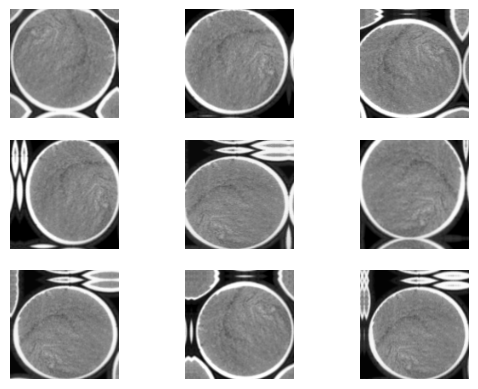

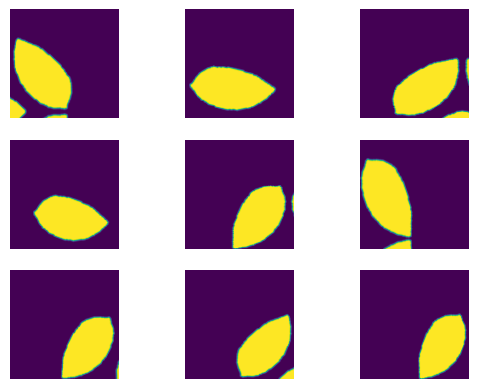

In [105]:
from matplotlib import pyplot as plt
# plot 9 augmentations of the image and the mask for one original image and its mask
for image, mask in train_ds.take(1):
    # random seed array
    seed = np.random.randint(0, 1000, 9)
    for i in range(9):
        plt.subplot(330 + 1 + i)
        augmented_image, augmented_mask = Augment(seed[i])(image, mask)
        plt.imshow(augmented_image.numpy())
        plt.axis("off")
    plt.show()
    for i in range(9):
        plt.subplot(330 + 1 + i)
        augmented_image, augmented_mask = Augment(seed[i])(image, mask)
        plt.imshow(augmented_mask.numpy())
        plt.axis("off")
    plt.show()

In [106]:
train_batches = (
    train_ds
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
    .repeat()
    .map(Augment())
    .prefetch(buffer_size=tf.data.AUTOTUNE))

test_batches = test_ds.batch(BATCH_SIZE)

In [107]:
from matplotlib import pyplot as plt

def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    # print the unique values of the image
    #print(np.unique(display_list[i]))
    plt.axis('off')
  plt.show()

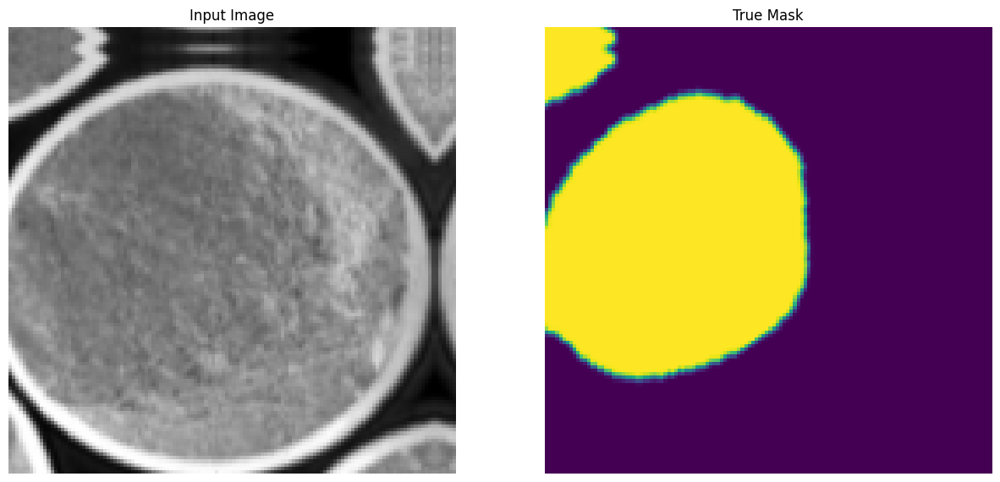

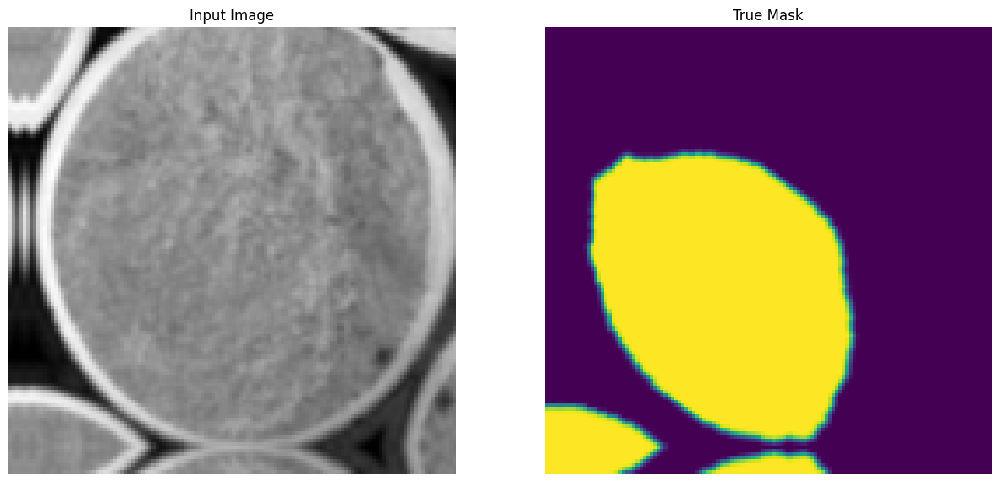

In [108]:
for images, masks in train_batches.take(2):
  sample_image, sample_mask = images[0], masks[0]
  display([sample_image, sample_mask])

In [109]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

# Make the last two layers trainable, but keep the rest frozen
for layer in down_stack.layers:  # Exclude the last two layers
    layer.trainable = False

# # Now, set the last two layers to be trainable
# for layer in down_stack.layers[-1:]:
#     layer.trainable = True

In [110]:
from tensorflow_examples.models.pix2pix import pix2pix

up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
    pix2pix.upsample(32, 3),   # 64x64 -> 128x128
]

# Make the last two layers of the up_stack trainable, but keep the rest frozen
# for layer in up_stack[0:0]:  # Exclude the last two layers
#     layer.trainable = False

# # Now, set the last two layers to be trainable
for layer in up_stack:
    layer.trainable = True


In [111]:
def unet_model(output_channels:int):
  inputs = tf.keras.layers.Input(shape=[128, 128, 3])

  # Downsampling through the model
  skips = down_stack(inputs)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      filters=output_channels, kernel_size=3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [112]:
# Try the model
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

In [113]:
class WeightedSCCE(tf.keras.losses.Loss):
    def __init__(self, class_weight, from_logits=False, name='weighted_scce'):
        if class_weight is None or all(v == 1. for v in class_weight):
            self.class_weight = None
        else:
            self.class_weight = tf.convert_to_tensor(class_weight,
                dtype=tf.float32)
        self.name = name
        self.reduction = tf.keras.losses.Reduction.NONE
        self.unreduced_scce = tf.keras.losses.SparseCategoricalCrossentropy(
            from_logits=from_logits, name=name,
            reduction=self.reduction)

    def __call__(self, y_true, y_pred, sample_weight=None):
        y_true = tf.cast(y_true, dtype=tf.int32)
        loss = self.unreduced_scce(y_true, y_pred, sample_weight)
        if self.class_weight is not None:
            weight_mask = tf.gather(self.class_weight, y_true)
            loss = tf.math.multiply(loss, weight_mask)
        return loss


In [114]:
import tensorflow as tf
# Assuming OUTPUT_CLASSES is the number of classes in your segmentation task
OUTPUT_CLASSES = 2

# Create the U-Net model
model = unet_model(output_channels=OUTPUT_CLASSES)

# Compile the model
model.compile(optimizer='adam',
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [115]:
def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

1/1 [==============================] - 1s 1s/step


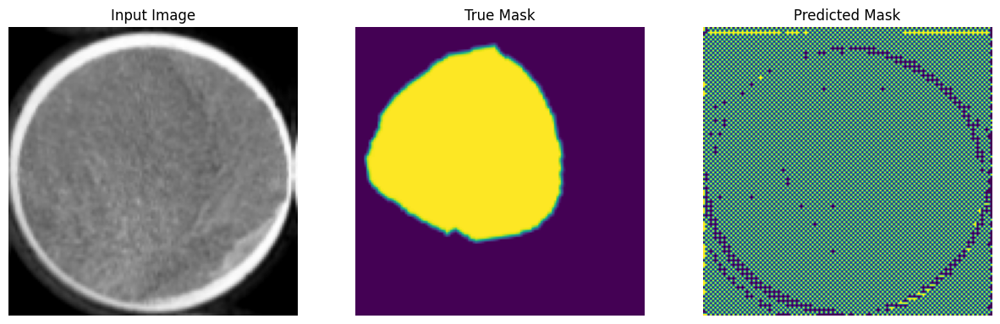

1/1 [==============================] - 0s 206ms/step


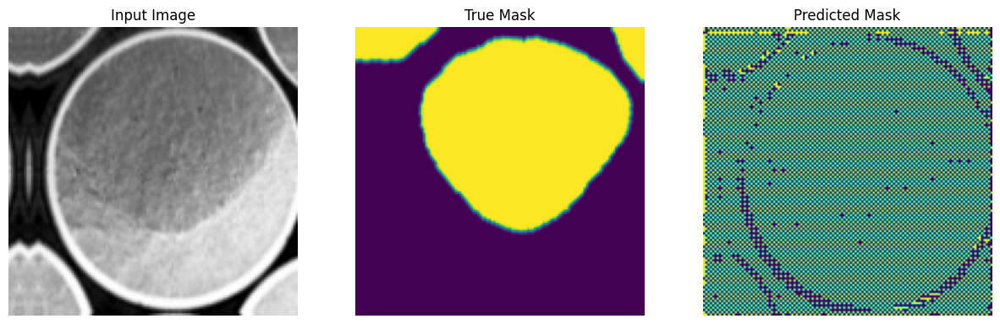

1/1 [==============================] - 0s 190ms/step


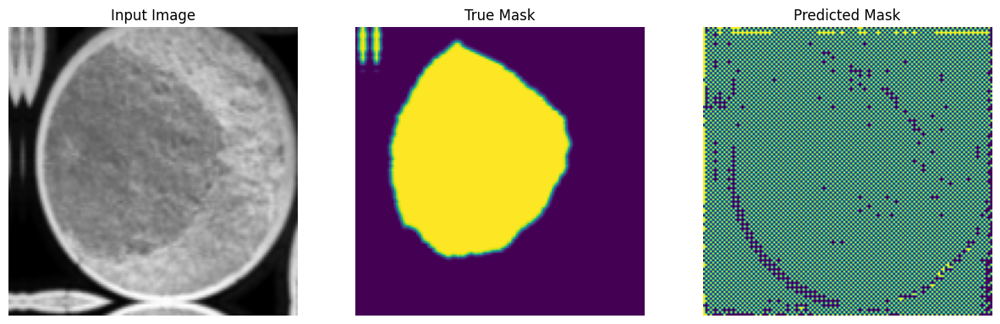

In [116]:
show_predictions(train_batches, 3)

In [117]:
from IPython.display import clear_output

class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    #clear_output(wait=True)
    show_predictions(train_batches, 1)
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

Epoch 1/200
1/1 [==============================] - 0s 190ms/step


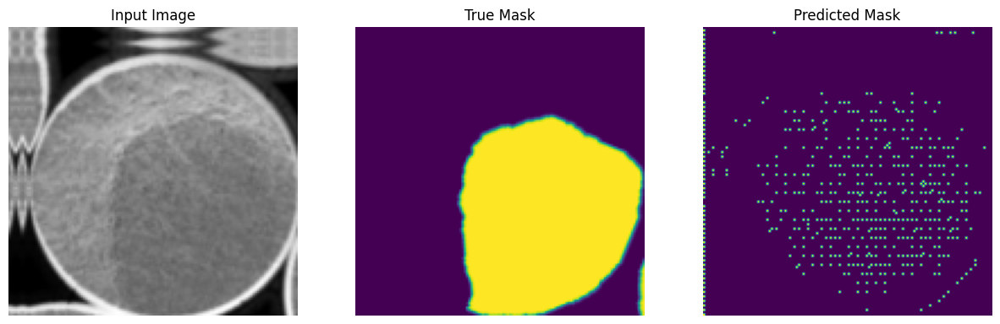


Sample Prediction after epoch 1

6/6 [==============================] - 7s 678ms/step - loss: 0.6445 - accuracy: 0.5828 - val_loss: 0.6293 - val_accuracy: 0.6905
Epoch 2/200
1/1 [==============================] - 0s 191ms/step


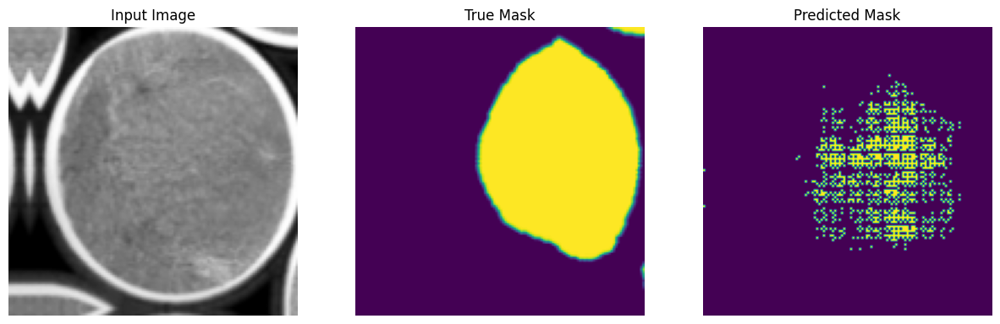


Sample Prediction after epoch 2

6/6 [==============================] - 3s 506ms/step - loss: 0.4740 - accuracy: 0.6680 - val_loss: 0.5480 - val_accuracy: 0.7298
Epoch 3/200
1/1 [==============================] - 0s 182ms/step


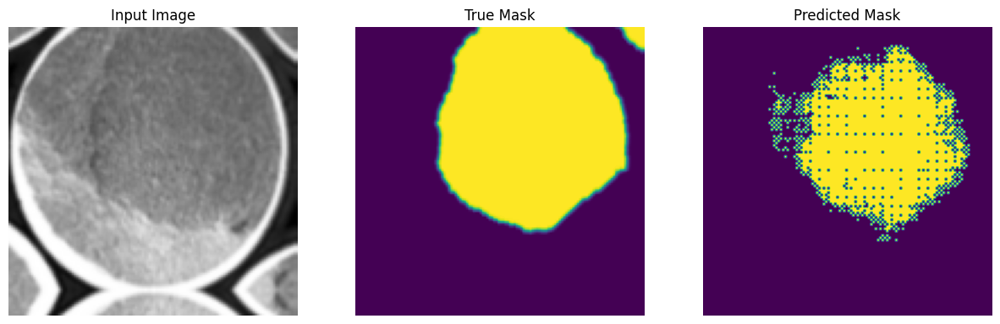


Sample Prediction after epoch 3

6/6 [==============================] - 3s 503ms/step - loss: 0.4206 - accuracy: 0.7269 - val_loss: 0.4597 - val_accuracy: 0.8084
Epoch 4/200
1/1 [==============================] - 0s 197ms/step


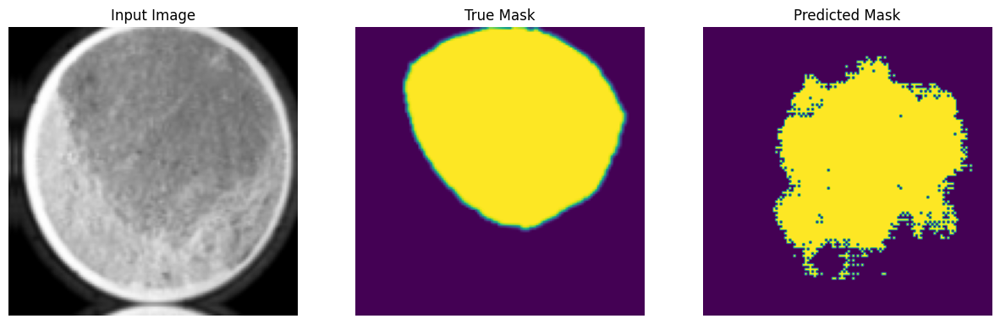


Sample Prediction after epoch 4

6/6 [==============================] - 3s 507ms/step - loss: 0.3847 - accuracy: 0.7678 - val_loss: 0.4835 - val_accuracy: 0.8049
Epoch 5/200
1/1 [==============================] - 0s 174ms/step


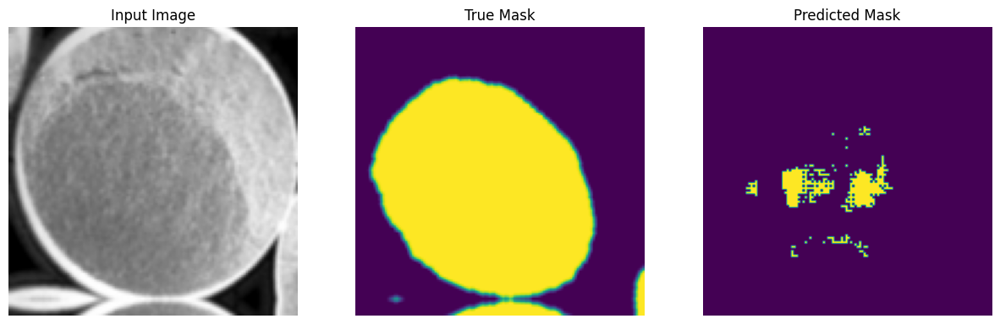


Sample Prediction after epoch 5

6/6 [==============================] - 3s 464ms/step - loss: 0.3506 - accuracy: 0.7860 - val_loss: 0.7194 - val_accuracy: 0.7354
Epoch 6/200
1/1 [==============================] - 0s 190ms/step


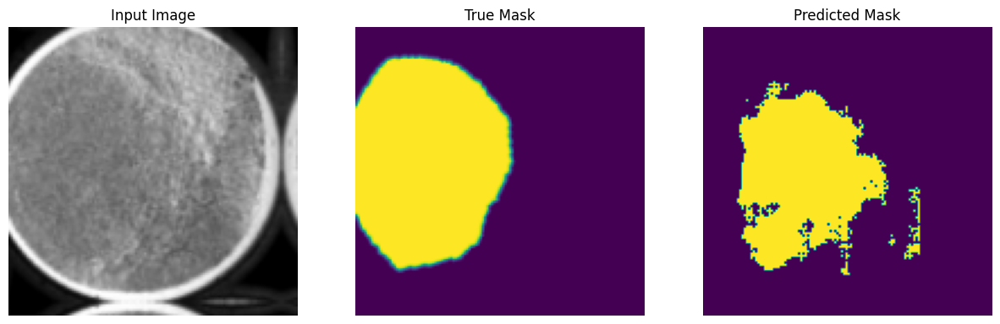


Sample Prediction after epoch 6

6/6 [==============================] - 3s 475ms/step - loss: 0.3476 - accuracy: 0.7774 - val_loss: 0.3820 - val_accuracy: 0.8523
Epoch 7/200
1/1 [==============================] - 0s 190ms/step


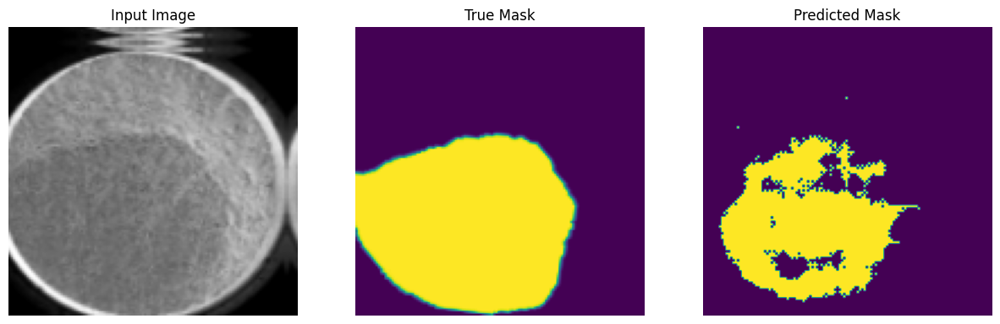


Sample Prediction after epoch 7

6/6 [==============================] - 3s 464ms/step - loss: 0.3269 - accuracy: 0.7870 - val_loss: 0.3873 - val_accuracy: 0.8386
Epoch 8/200
1/1 [==============================] - 0s 188ms/step


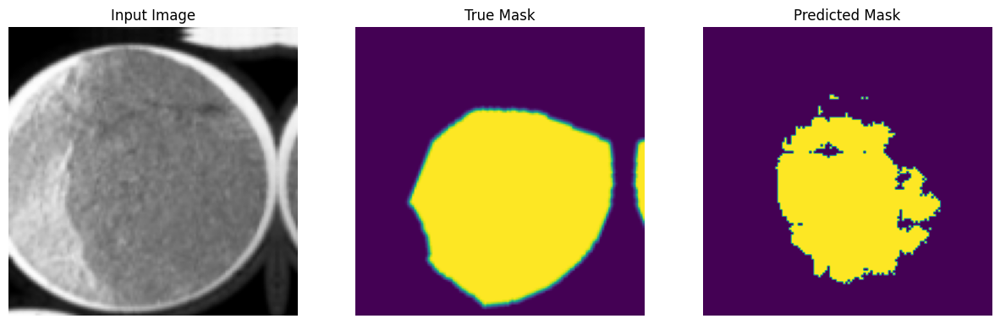


Sample Prediction after epoch 8

6/6 [==============================] - 3s 511ms/step - loss: 0.3042 - accuracy: 0.8058 - val_loss: 0.3228 - val_accuracy: 0.8670
Epoch 9/200
1/1 [==============================] - 0s 203ms/step


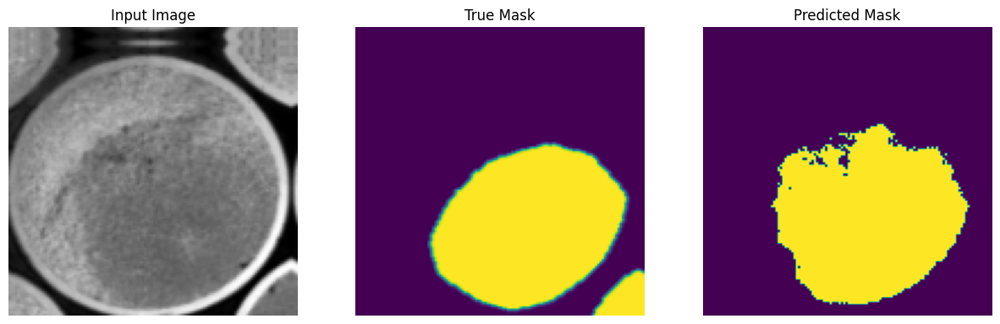


Sample Prediction after epoch 9

6/6 [==============================] - 3s 504ms/step - loss: 0.3037 - accuracy: 0.8055 - val_loss: 0.4077 - val_accuracy: 0.8400
Epoch 10/200
1/1 [==============================] - 0s 175ms/step


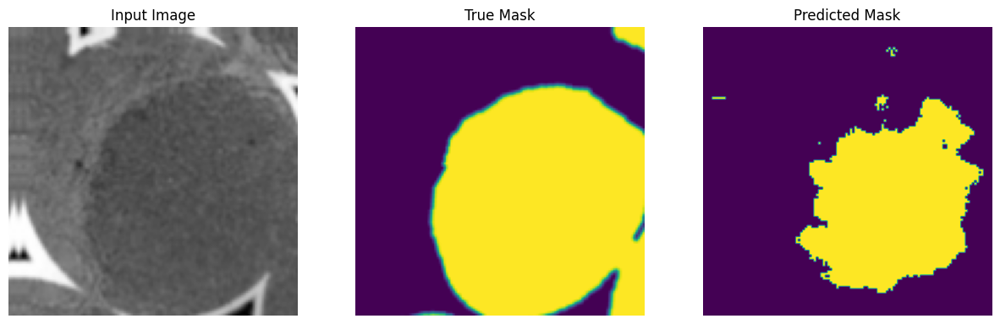


Sample Prediction after epoch 10

6/6 [==============================] - 3s 474ms/step - loss: 0.2888 - accuracy: 0.8074 - val_loss: 0.2962 - val_accuracy: 0.8745
Epoch 11/200
1/1 [==============================] - 0s 174ms/step


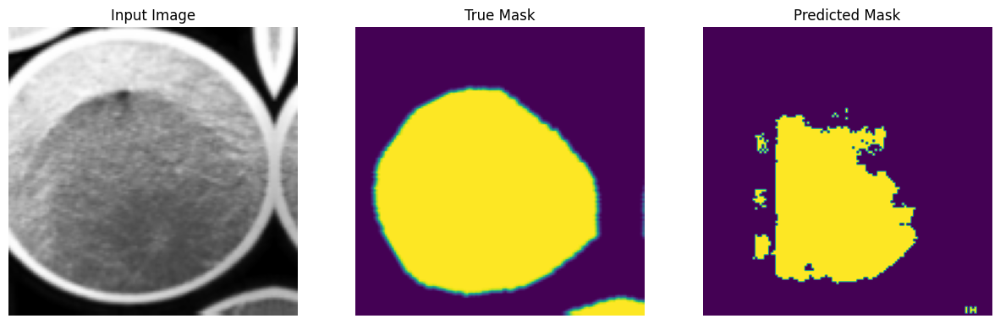


Sample Prediction after epoch 11

6/6 [==============================] - 3s 464ms/step - loss: 0.2715 - accuracy: 0.8170 - val_loss: 0.2965 - val_accuracy: 0.8722
Epoch 12/200
1/1 [==============================] - 0s 191ms/step


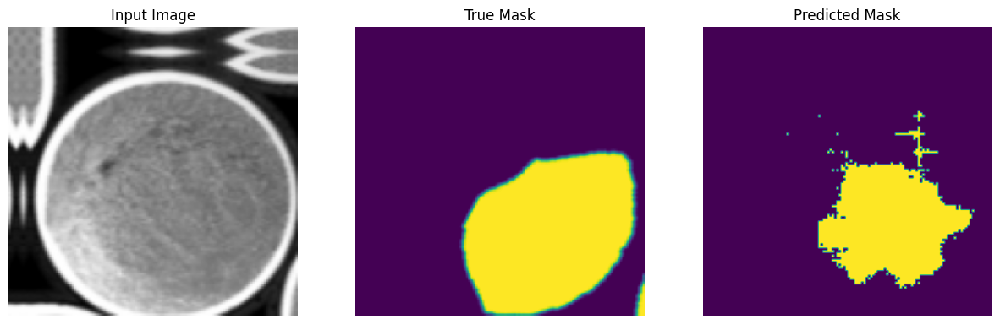


Sample Prediction after epoch 12

6/6 [==============================] - 3s 463ms/step - loss: 0.2630 - accuracy: 0.8224 - val_loss: 0.3345 - val_accuracy: 0.8626
Epoch 13/200
1/1 [==============================] - 0s 175ms/step


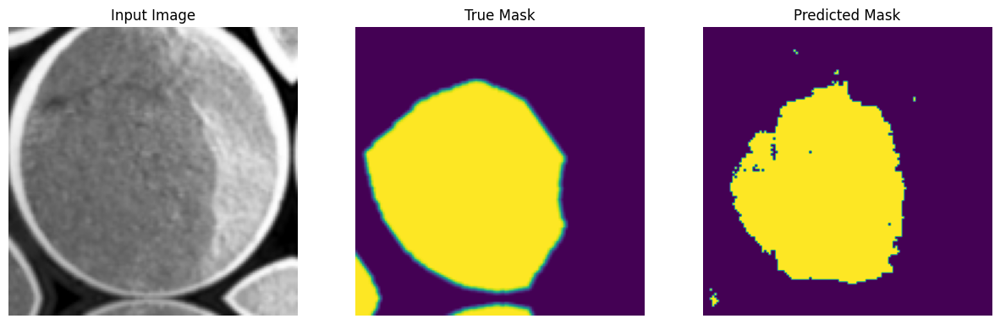


Sample Prediction after epoch 13

6/6 [==============================] - 3s 467ms/step - loss: 0.2766 - accuracy: 0.8145 - val_loss: 0.2965 - val_accuracy: 0.8749
Epoch 14/200
1/1 [==============================] - 0s 189ms/step


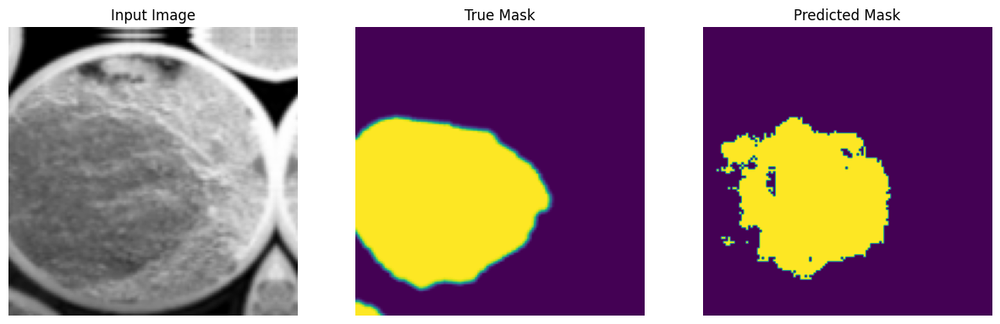


Sample Prediction after epoch 14

6/6 [==============================] - 3s 485ms/step - loss: 0.2798 - accuracy: 0.8113 - val_loss: 0.3023 - val_accuracy: 0.8737
Epoch 15/200
1/1 [==============================] - 0s 193ms/step


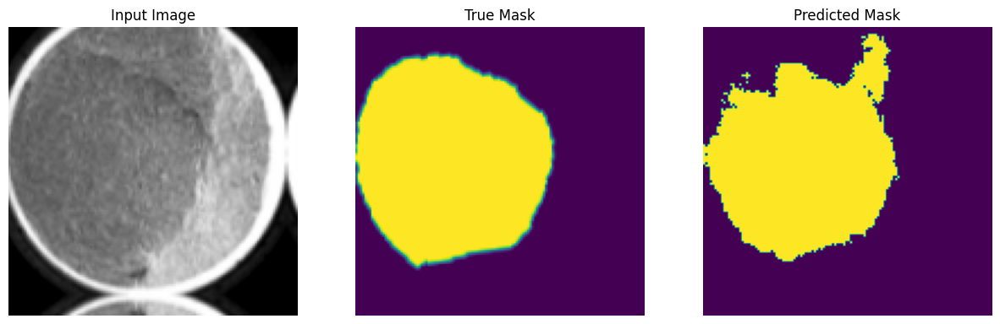


Sample Prediction after epoch 15

6/6 [==============================] - 3s 503ms/step - loss: 0.2619 - accuracy: 0.8196 - val_loss: 0.2909 - val_accuracy: 0.8753
Epoch 16/200
1/1 [==============================] - 0s 184ms/step


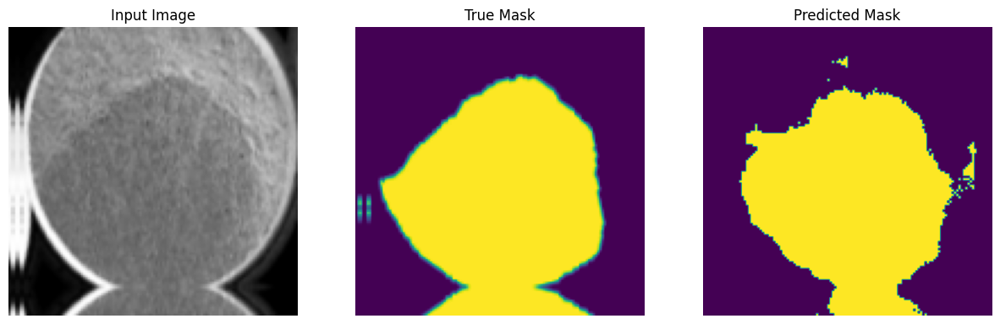


Sample Prediction after epoch 16

6/6 [==============================] - 3s 492ms/step - loss: 0.2581 - accuracy: 0.8236 - val_loss: 0.3479 - val_accuracy: 0.8589
Epoch 17/200
1/1 [==============================] - 0s 175ms/step


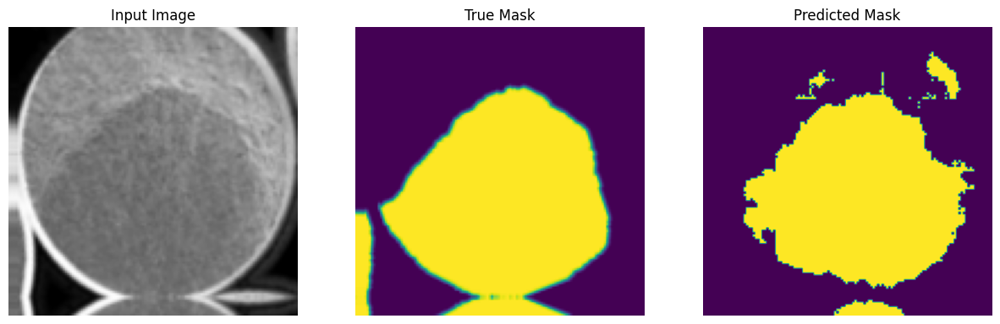


Sample Prediction after epoch 17

6/6 [==============================] - 3s 463ms/step - loss: 0.2438 - accuracy: 0.8279 - val_loss: 0.2690 - val_accuracy: 0.8824
Epoch 18/200
1/1 [==============================] - 0s 191ms/step


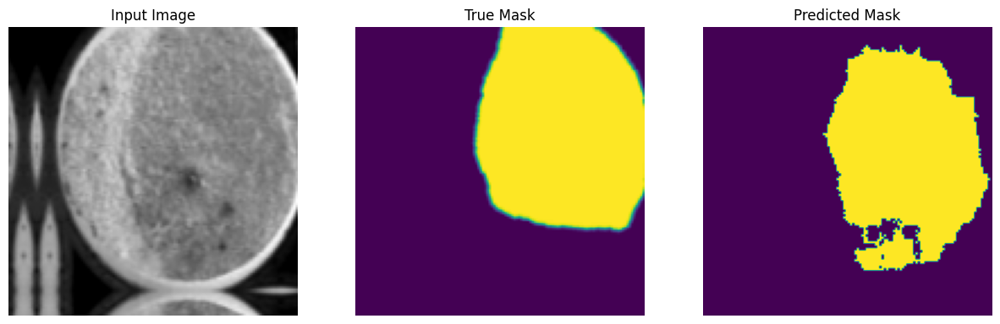


Sample Prediction after epoch 18

6/6 [==============================] - 3s 462ms/step - loss: 0.2427 - accuracy: 0.8330 - val_loss: 0.3018 - val_accuracy: 0.8759
Epoch 19/200
1/1 [==============================] - 0s 175ms/step


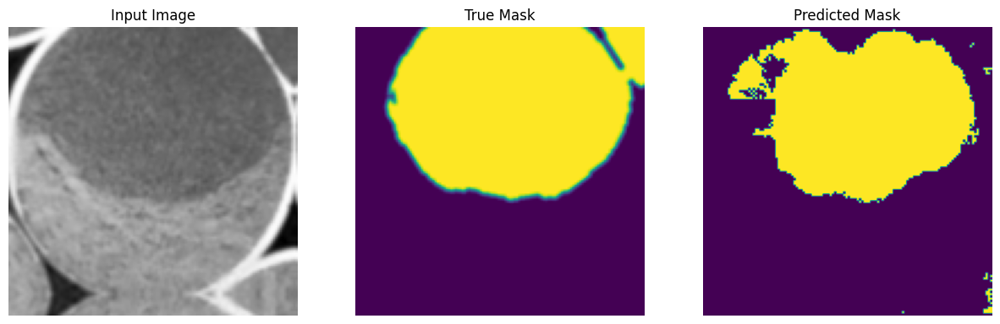


Sample Prediction after epoch 19

6/6 [==============================] - 3s 474ms/step - loss: 0.2688 - accuracy: 0.8158 - val_loss: 0.2633 - val_accuracy: 0.8837
Epoch 20/200
1/1 [==============================] - 0s 174ms/step


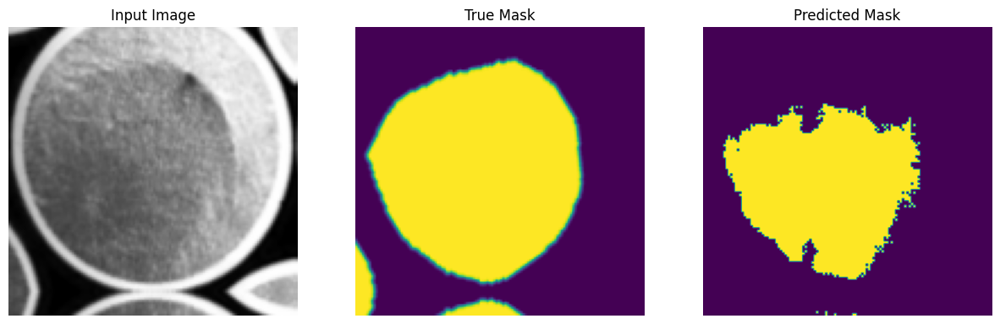


Sample Prediction after epoch 20

6/6 [==============================] - 3s 467ms/step - loss: 0.2234 - accuracy: 0.8455 - val_loss: 0.2814 - val_accuracy: 0.8827
Epoch 21/200
1/1 [==============================] - 0s 190ms/step


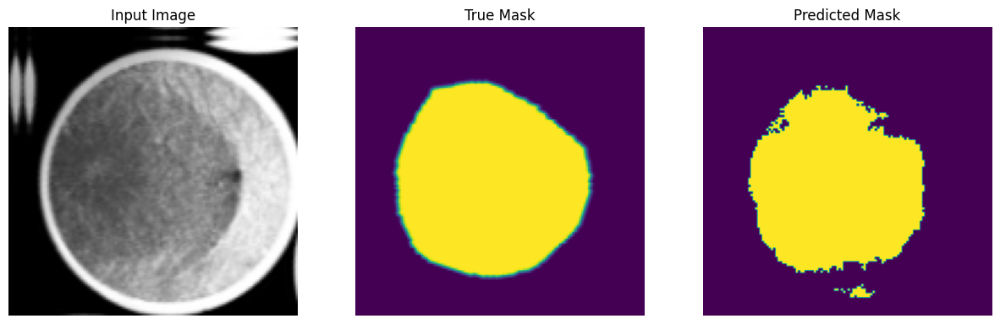


Sample Prediction after epoch 21

6/6 [==============================] - 3s 463ms/step - loss: 0.2605 - accuracy: 0.8173 - val_loss: 0.2816 - val_accuracy: 0.8814
Epoch 22/200
1/1 [==============================] - 0s 176ms/step


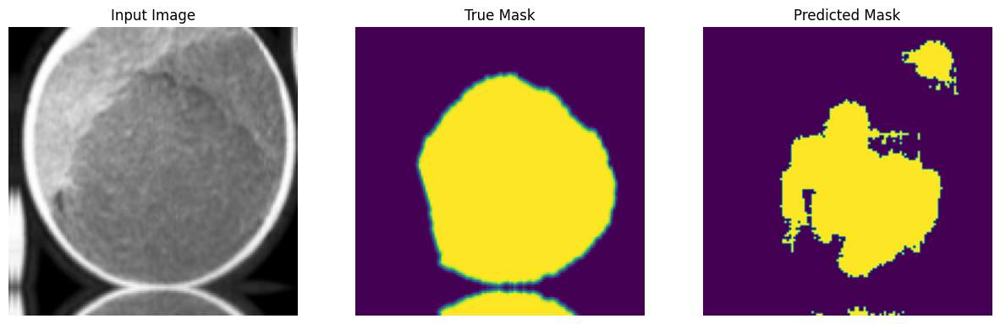


Sample Prediction after epoch 22

6/6 [==============================] - 3s 494ms/step - loss: 0.2476 - accuracy: 0.8307 - val_loss: 0.2875 - val_accuracy: 0.8770
Epoch 23/200
1/1 [==============================] - 0s 174ms/step


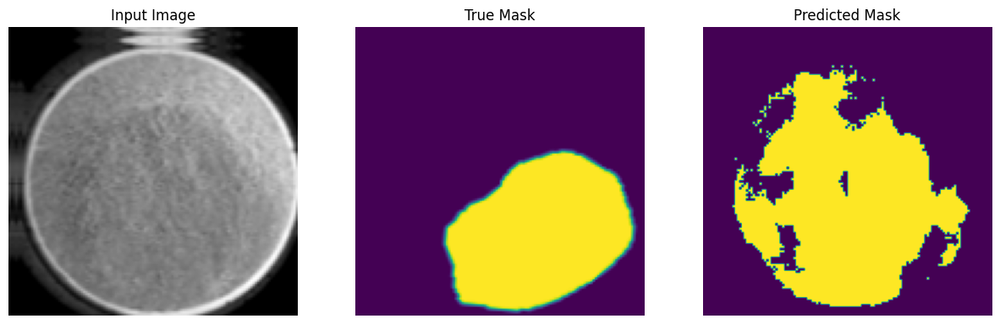


Sample Prediction after epoch 23

6/6 [==============================] - 3s 590ms/step - loss: 0.2246 - accuracy: 0.8432 - val_loss: 0.3080 - val_accuracy: 0.8749
Epoch 24/200
1/1 [==============================] - 0s 193ms/step


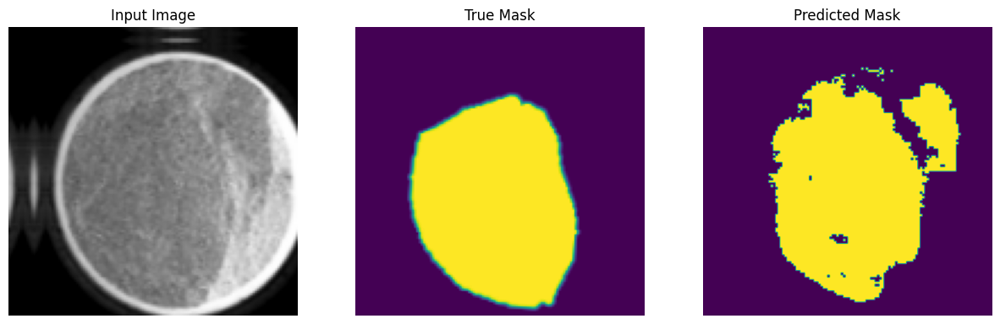


Sample Prediction after epoch 24

6/6 [==============================] - 3s 469ms/step - loss: 0.2437 - accuracy: 0.8294 - val_loss: 0.2639 - val_accuracy: 0.8837
Epoch 25/200
1/1 [==============================] - 0s 194ms/step


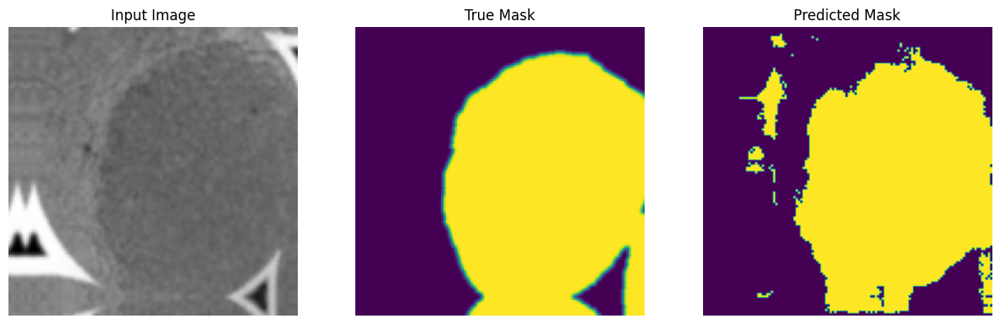


Sample Prediction after epoch 25

6/6 [==============================] - 3s 490ms/step - loss: 0.2470 - accuracy: 0.8269 - val_loss: 0.3136 - val_accuracy: 0.8698
Epoch 26/200
1/1 [==============================] - 0s 175ms/step


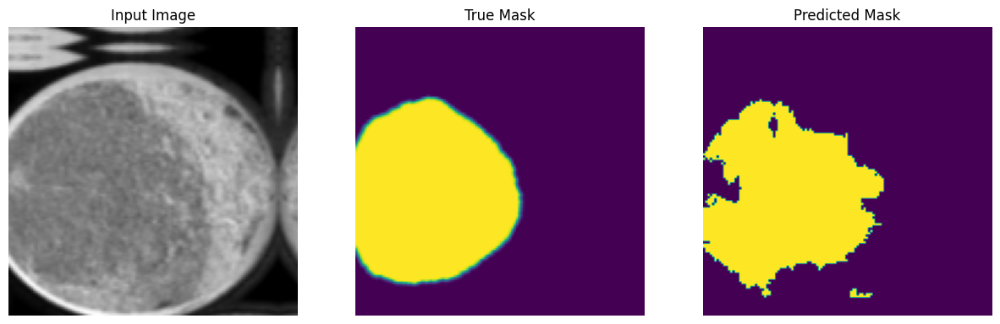


Sample Prediction after epoch 26

6/6 [==============================] - 3s 510ms/step - loss: 0.2392 - accuracy: 0.8328 - val_loss: 0.2670 - val_accuracy: 0.8873
Epoch 27/200
1/1 [==============================] - 0s 196ms/step


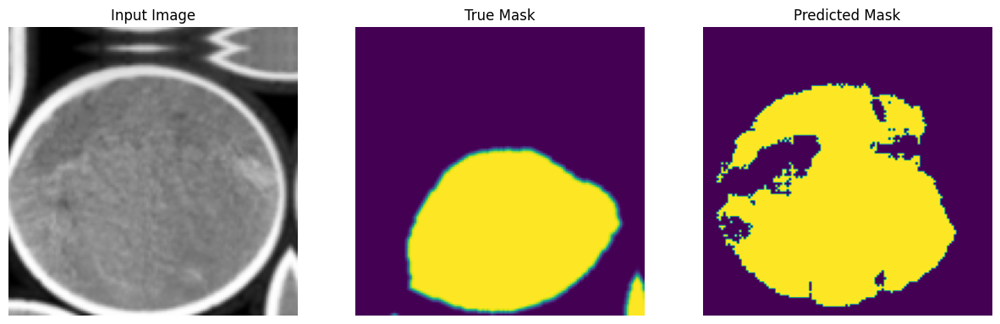


Sample Prediction after epoch 27

6/6 [==============================] - 3s 456ms/step - loss: 0.2224 - accuracy: 0.8405 - val_loss: 0.2920 - val_accuracy: 0.8811
Epoch 28/200
1/1 [==============================] - 0s 194ms/step


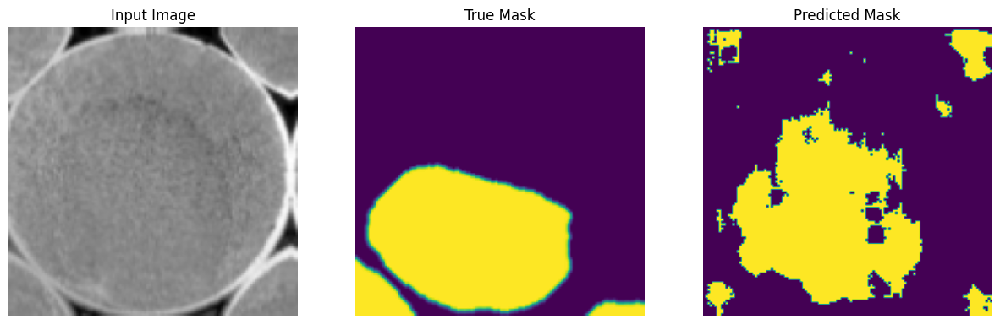


Sample Prediction after epoch 28

6/6 [==============================] - 3s 470ms/step - loss: 0.2484 - accuracy: 0.8292 - val_loss: 0.2637 - val_accuracy: 0.8855
Epoch 29/200
1/1 [==============================] - 0s 191ms/step


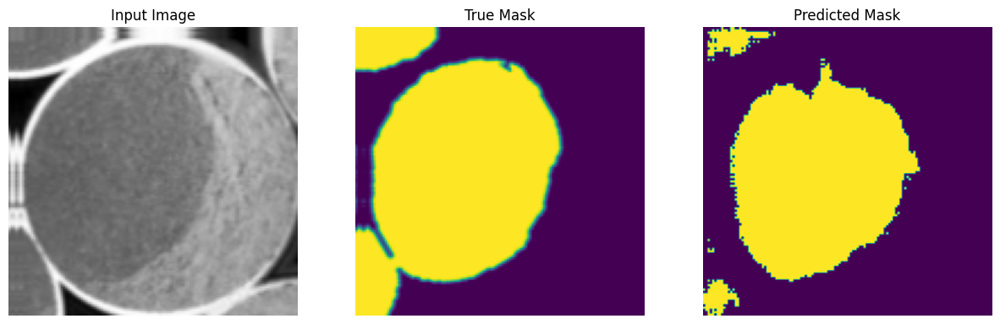


Sample Prediction after epoch 29

6/6 [==============================] - 3s 499ms/step - loss: 0.2271 - accuracy: 0.8397 - val_loss: 0.2588 - val_accuracy: 0.8895
Epoch 30/200
1/1 [==============================] - 0s 195ms/step


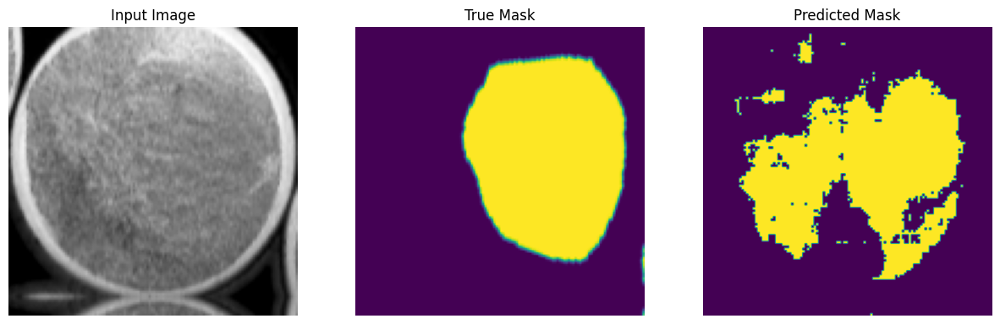


Sample Prediction after epoch 30

6/6 [==============================] - 3s 506ms/step - loss: 0.2273 - accuracy: 0.8332 - val_loss: 0.2636 - val_accuracy: 0.8874
Epoch 31/200
1/1 [==============================] - 0s 191ms/step


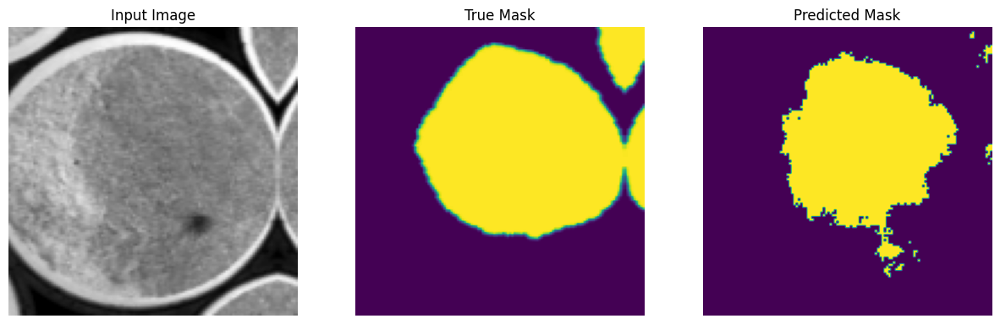


Sample Prediction after epoch 31

6/6 [==============================] - 3s 463ms/step - loss: 0.2569 - accuracy: 0.8293 - val_loss: 0.2645 - val_accuracy: 0.8867
Epoch 32/200
1/1 [==============================] - 0s 214ms/step


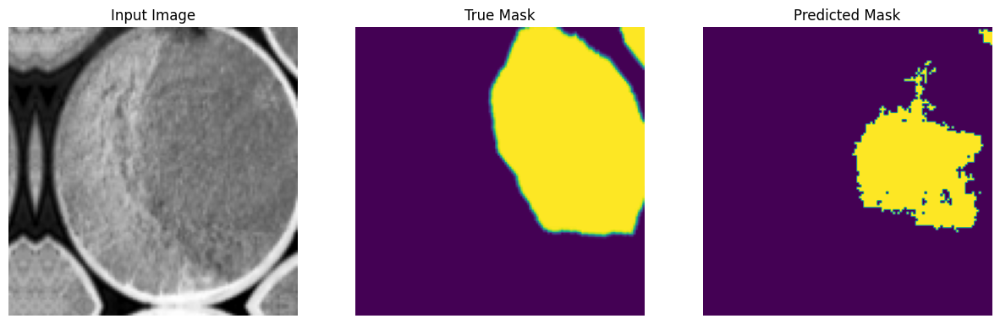


Sample Prediction after epoch 32

6/6 [==============================] - 3s 482ms/step - loss: 0.2071 - accuracy: 0.8511 - val_loss: 0.3267 - val_accuracy: 0.8606
Epoch 33/200
1/1 [==============================] - 0s 182ms/step


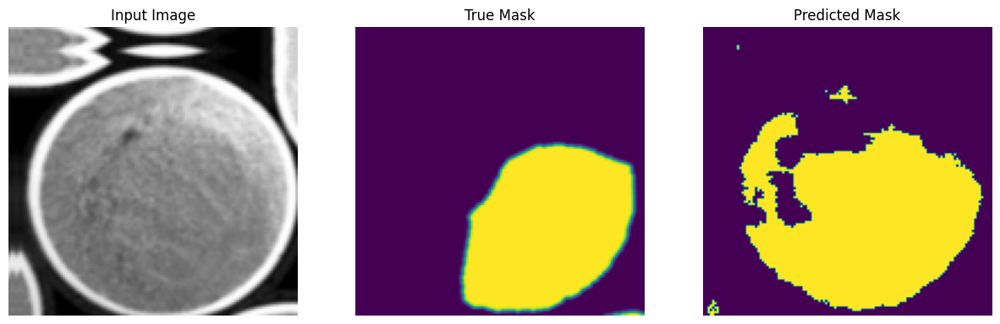


Sample Prediction after epoch 33

6/6 [==============================] - 3s 487ms/step - loss: 0.2271 - accuracy: 0.8388 - val_loss: 0.2554 - val_accuracy: 0.8894
Epoch 34/200
1/1 [==============================] - 0s 188ms/step


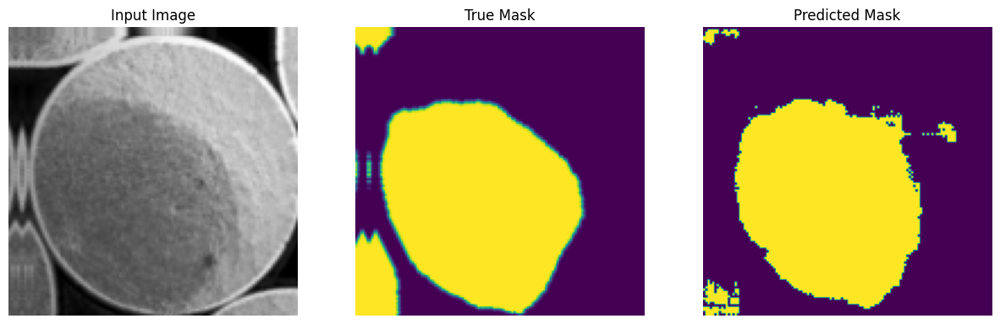


Sample Prediction after epoch 34

6/6 [==============================] - 3s 477ms/step - loss: 0.2354 - accuracy: 0.8338 - val_loss: 0.2661 - val_accuracy: 0.8916
Epoch 35/200
1/1 [==============================] - 0s 190ms/step


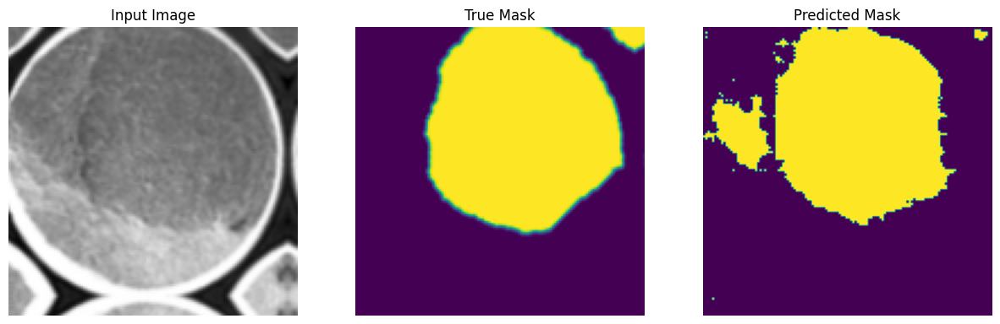


Sample Prediction after epoch 35

6/6 [==============================] - 3s 469ms/step - loss: 0.2321 - accuracy: 0.8373 - val_loss: 0.3121 - val_accuracy: 0.8761
Epoch 36/200
1/1 [==============================] - 0s 201ms/step


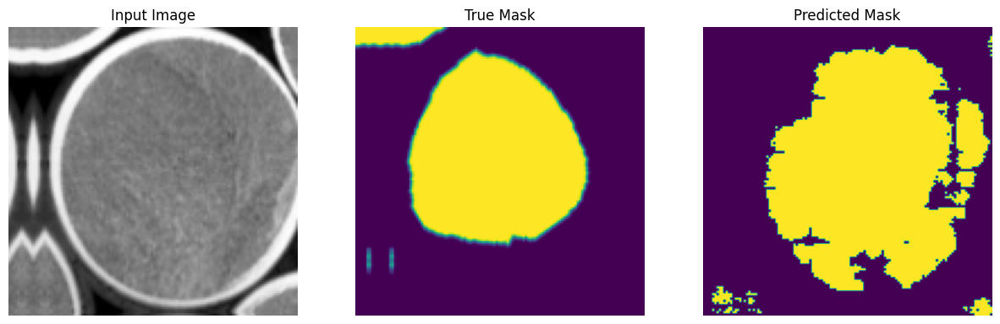


Sample Prediction after epoch 36

6/6 [==============================] - 3s 557ms/step - loss: 0.2549 - accuracy: 0.8217 - val_loss: 0.3395 - val_accuracy: 0.8677
Epoch 37/200
1/1 [==============================] - 0s 191ms/step


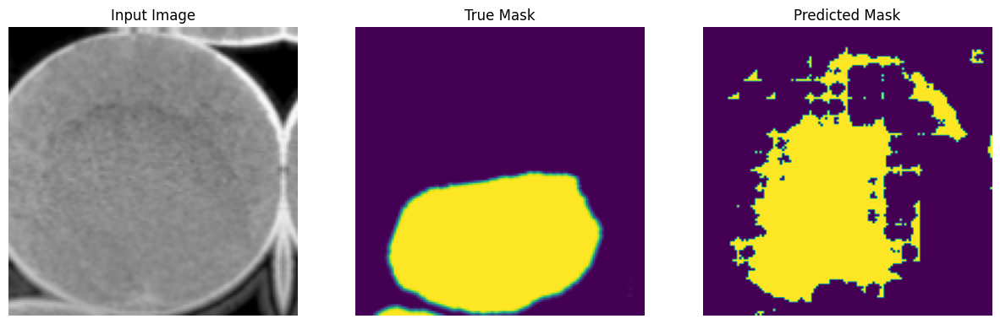


Sample Prediction after epoch 37

6/6 [==============================] - 3s 556ms/step - loss: 0.2283 - accuracy: 0.8353 - val_loss: 0.2596 - val_accuracy: 0.8890
Epoch 38/200
1/1 [==============================] - 0s 173ms/step


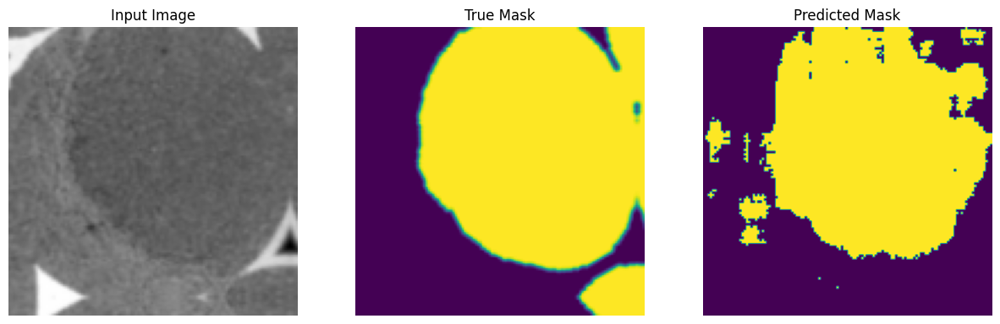


Sample Prediction after epoch 38

6/6 [==============================] - 3s 475ms/step - loss: 0.2472 - accuracy: 0.8277 - val_loss: 0.2978 - val_accuracy: 0.8844
Epoch 39/200
1/1 [==============================] - 0s 183ms/step


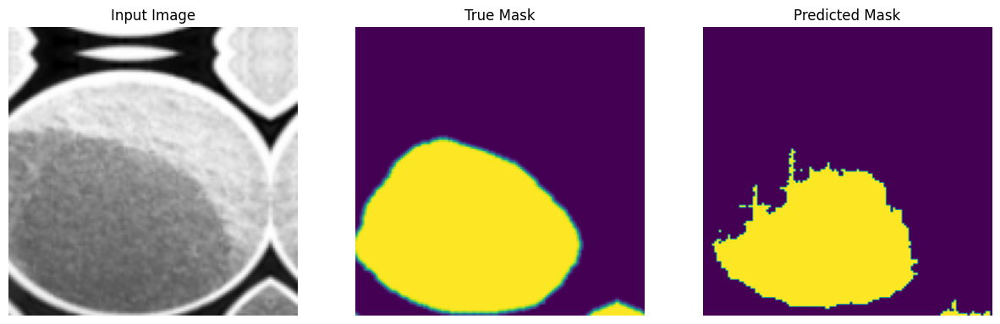


Sample Prediction after epoch 39

6/6 [==============================] - 3s 468ms/step - loss: 0.2272 - accuracy: 0.8347 - val_loss: 0.2965 - val_accuracy: 0.8846
Epoch 40/200
1/1 [==============================] - 0s 185ms/step


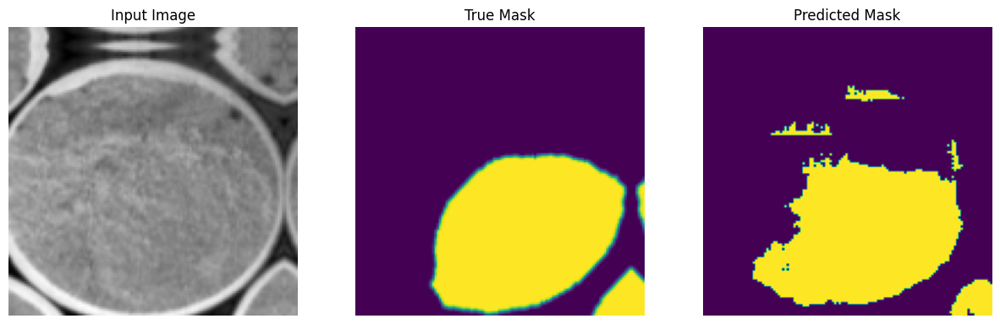


Sample Prediction after epoch 40

6/6 [==============================] - 3s 465ms/step - loss: 0.2022 - accuracy: 0.8514 - val_loss: 0.2740 - val_accuracy: 0.8872
Epoch 41/200
1/1 [==============================] - 0s 179ms/step


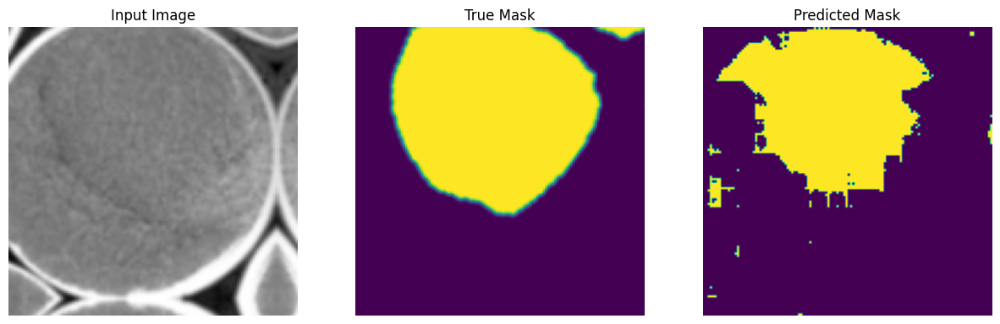


Sample Prediction after epoch 41

6/6 [==============================] - 3s 479ms/step - loss: 0.2184 - accuracy: 0.8428 - val_loss: 0.3742 - val_accuracy: 0.8556
Epoch 42/200
1/1 [==============================] - 0s 190ms/step


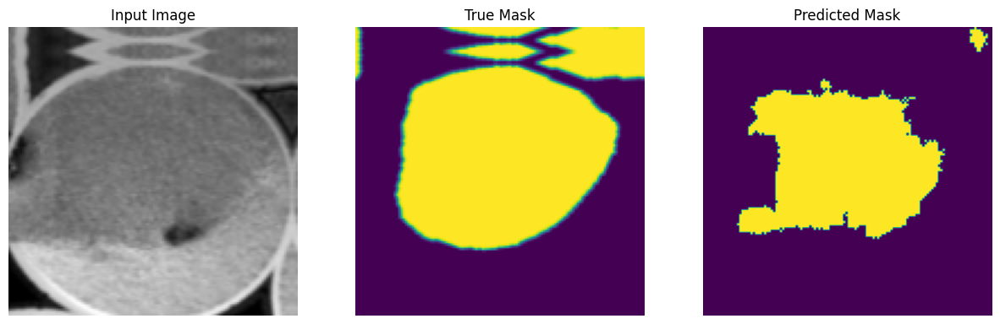


Sample Prediction after epoch 42

6/6 [==============================] - 3s 479ms/step - loss: 0.2260 - accuracy: 0.8388 - val_loss: 0.3128 - val_accuracy: 0.8773
Epoch 43/200
1/1 [==============================] - 0s 190ms/step


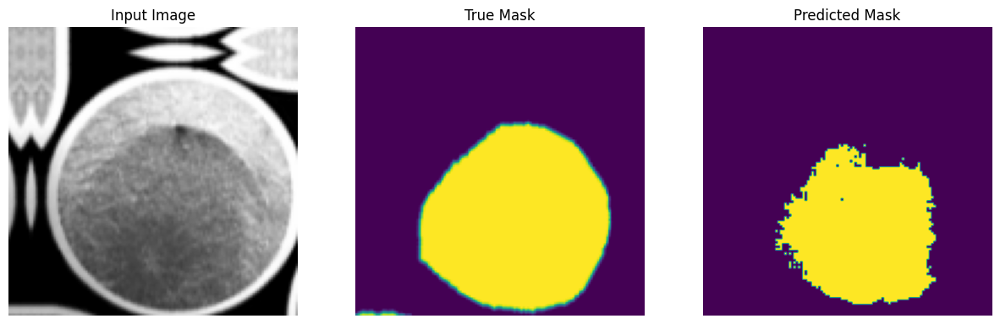


Sample Prediction after epoch 43

6/6 [==============================] - 3s 537ms/step - loss: 0.2439 - accuracy: 0.8246 - val_loss: 0.2743 - val_accuracy: 0.8818
Epoch 44/200
1/1 [==============================] - 0s 202ms/step


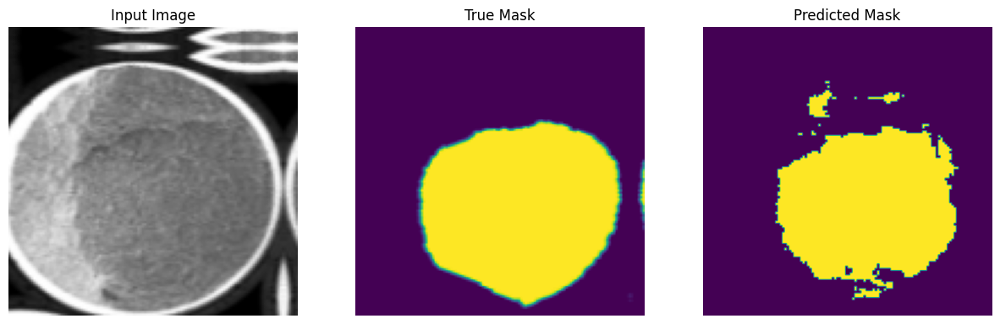


Sample Prediction after epoch 44

6/6 [==============================] - 3s 497ms/step - loss: 0.2134 - accuracy: 0.8480 - val_loss: 0.2717 - val_accuracy: 0.8871
Epoch 45/200
1/1 [==============================] - 0s 192ms/step


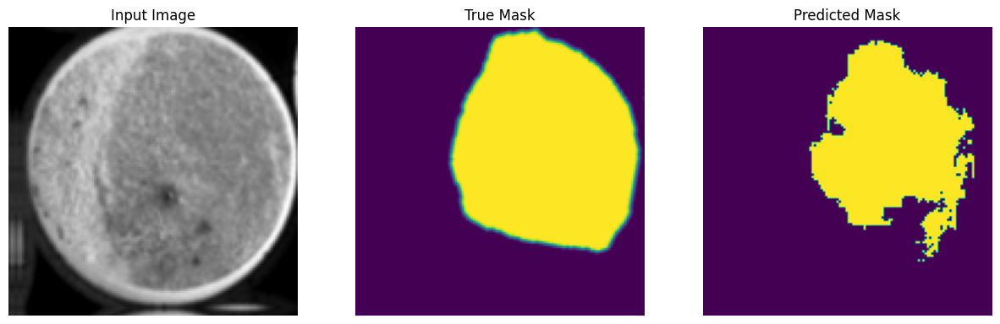


Sample Prediction after epoch 45

6/6 [==============================] - 3s 494ms/step - loss: 0.2184 - accuracy: 0.8451 - val_loss: 0.2582 - val_accuracy: 0.8933
Epoch 46/200
1/1 [==============================] - 0s 174ms/step


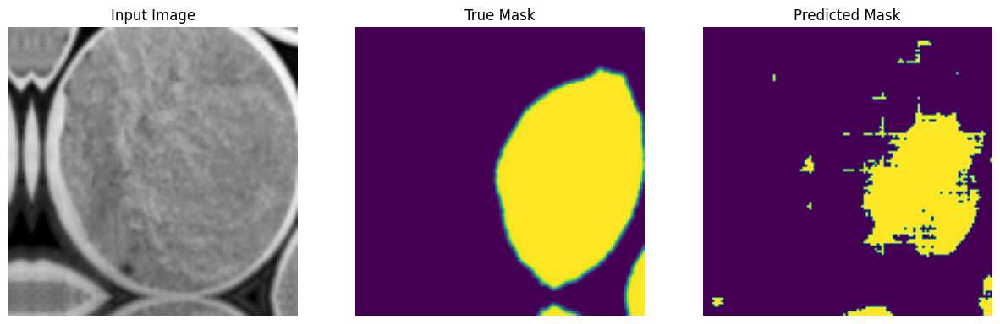


Sample Prediction after epoch 46

6/6 [==============================] - 3s 477ms/step - loss: 0.2169 - accuracy: 0.8432 - val_loss: 0.2479 - val_accuracy: 0.8937
Epoch 47/200
1/1 [==============================] - 0s 181ms/step


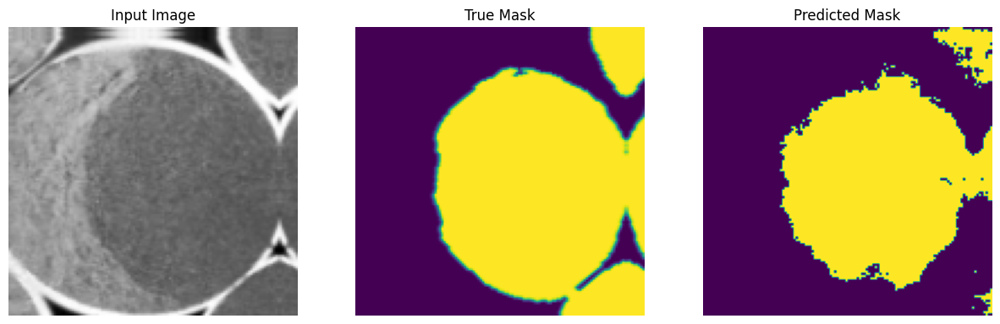


Sample Prediction after epoch 47

6/6 [==============================] - 3s 477ms/step - loss: 0.2116 - accuracy: 0.8471 - val_loss: 0.2457 - val_accuracy: 0.8956
Epoch 48/200
1/1 [==============================] - 0s 175ms/step


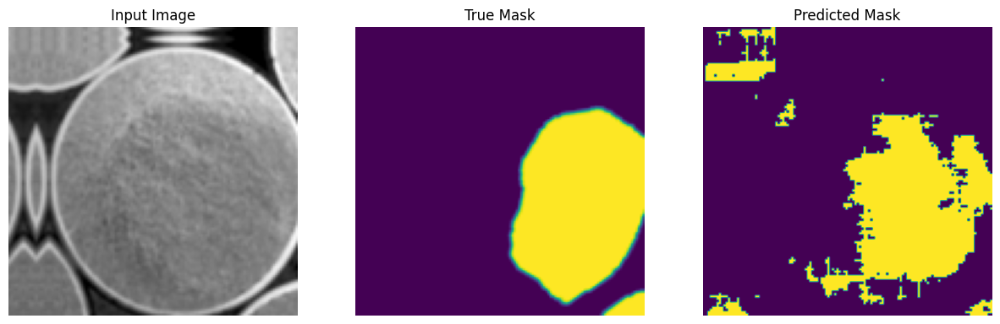


Sample Prediction after epoch 48

6/6 [==============================] - 3s 470ms/step - loss: 0.2120 - accuracy: 0.8457 - val_loss: 0.2467 - val_accuracy: 0.8970
Epoch 49/200
1/1 [==============================] - 0s 194ms/step


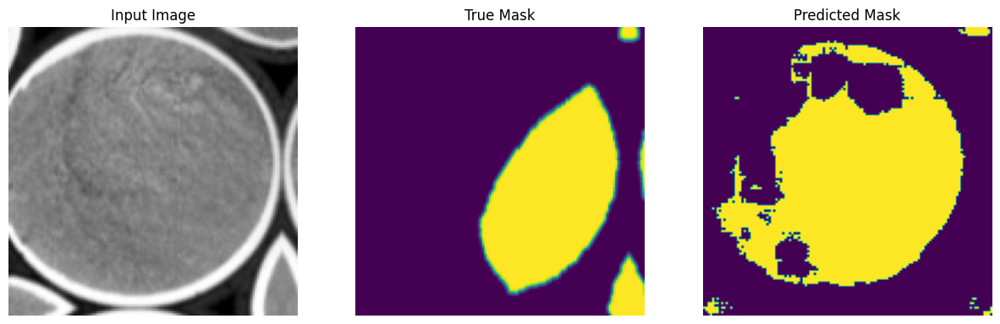


Sample Prediction after epoch 49

6/6 [==============================] - 3s 502ms/step - loss: 0.1998 - accuracy: 0.8486 - val_loss: 0.2524 - val_accuracy: 0.8916
Epoch 50/200
1/1 [==============================] - 0s 189ms/step


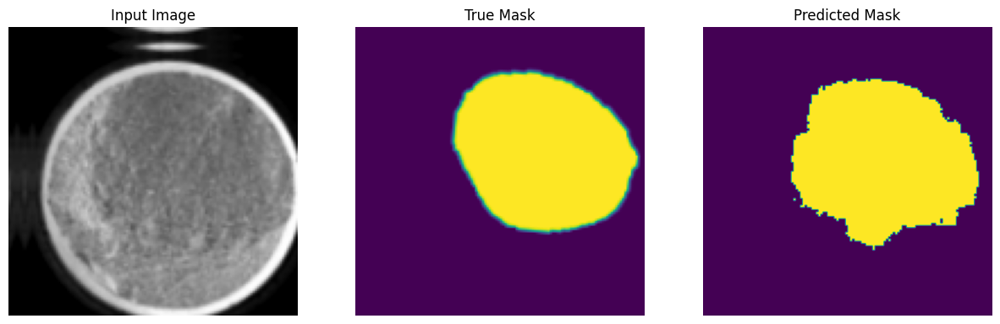


Sample Prediction after epoch 50

6/6 [==============================] - 3s 623ms/step - loss: 0.1917 - accuracy: 0.8593 - val_loss: 0.2603 - val_accuracy: 0.8907
Epoch 51/200
1/1 [==============================] - 0s 205ms/step


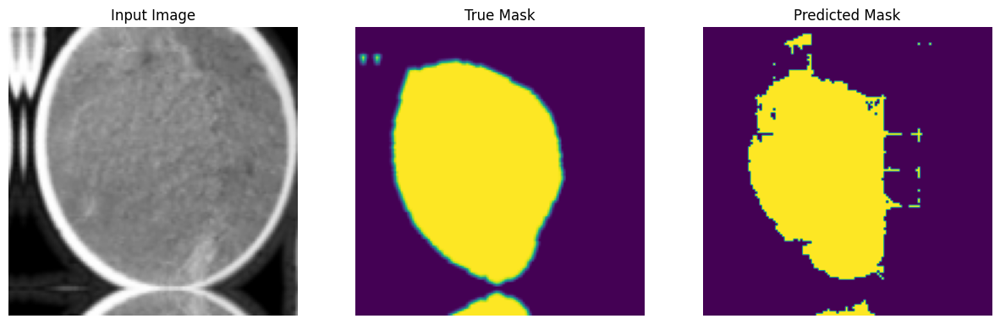


Sample Prediction after epoch 51

6/6 [==============================] - 3s 563ms/step - loss: 0.2146 - accuracy: 0.8421 - val_loss: 0.2539 - val_accuracy: 0.8933
Epoch 52/200
1/1 [==============================] - 0s 189ms/step


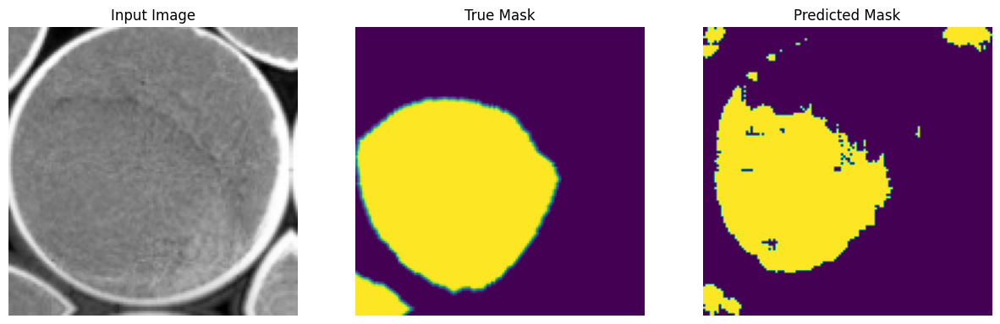


Sample Prediction after epoch 52

6/6 [==============================] - 3s 489ms/step - loss: 0.2052 - accuracy: 0.8495 - val_loss: 0.2588 - val_accuracy: 0.8916
Epoch 53/200
1/1 [==============================] - 0s 205ms/step


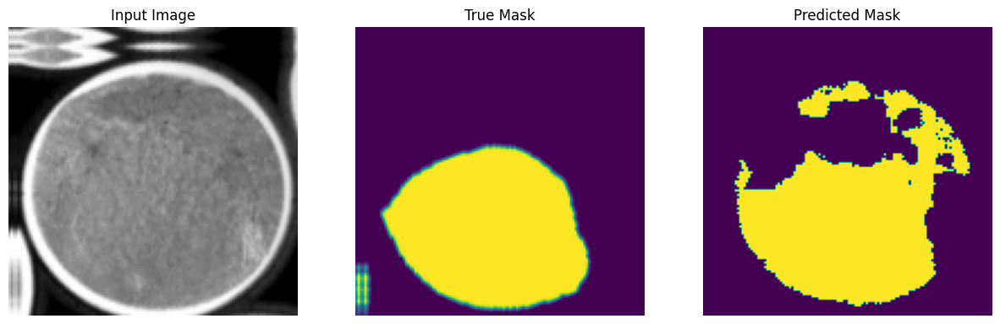


Sample Prediction after epoch 53

6/6 [==============================] - 3s 497ms/step - loss: 0.1844 - accuracy: 0.8624 - val_loss: 0.2416 - val_accuracy: 0.8965
Epoch 54/200
1/1 [==============================] - 0s 185ms/step


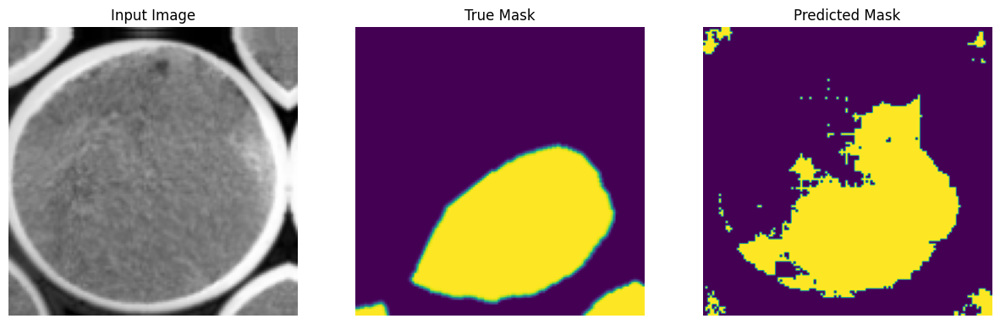


Sample Prediction after epoch 54

6/6 [==============================] - 3s 511ms/step - loss: 0.2185 - accuracy: 0.8426 - val_loss: 0.2411 - val_accuracy: 0.8967
Epoch 55/200
1/1 [==============================] - 0s 191ms/step


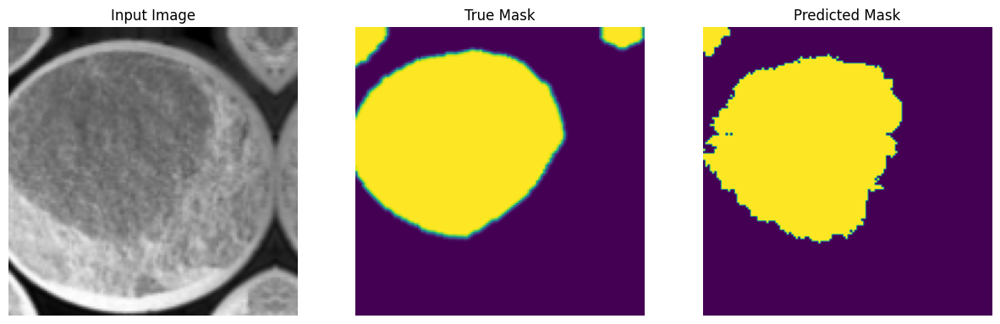


Sample Prediction after epoch 55

6/6 [==============================] - 3s 461ms/step - loss: 0.2003 - accuracy: 0.8517 - val_loss: 0.2456 - val_accuracy: 0.8954
Epoch 56/200
1/1 [==============================] - 0s 160ms/step


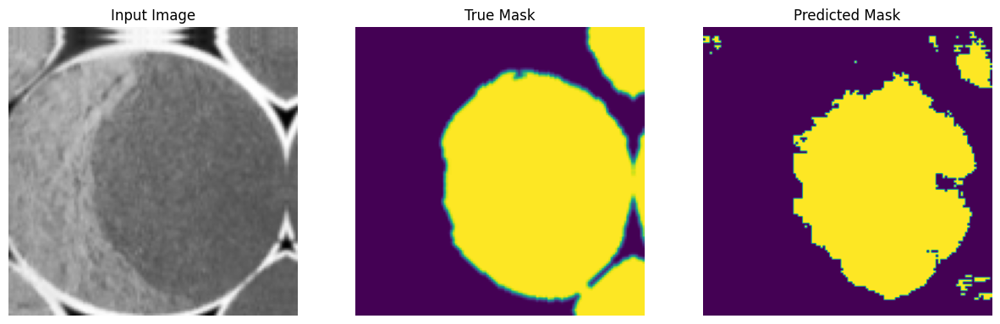


Sample Prediction after epoch 56

6/6 [==============================] - 3s 464ms/step - loss: 0.1993 - accuracy: 0.8523 - val_loss: 0.2418 - val_accuracy: 0.8956
Epoch 57/200
1/1 [==============================] - 0s 178ms/step


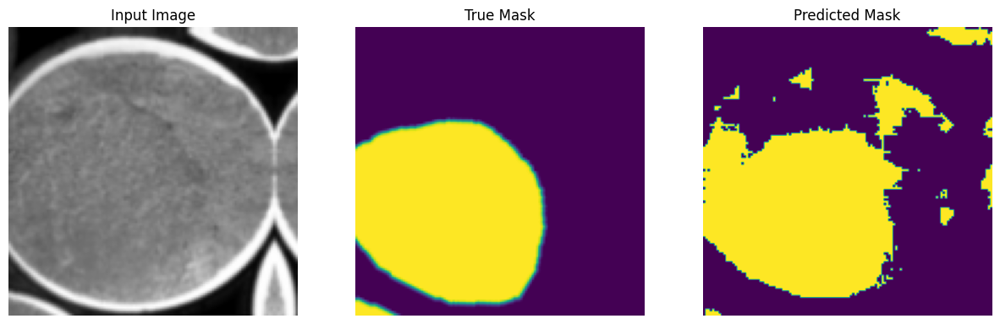


Sample Prediction after epoch 57

6/6 [==============================] - 3s 498ms/step - loss: 0.2022 - accuracy: 0.8471 - val_loss: 0.2468 - val_accuracy: 0.8974
Epoch 58/200
1/1 [==============================] - 0s 190ms/step


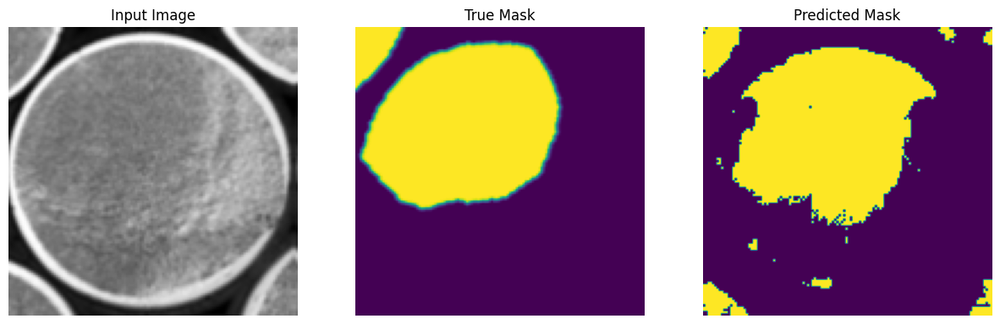


Sample Prediction after epoch 58

6/6 [==============================] - 3s 505ms/step - loss: 0.2132 - accuracy: 0.8453 - val_loss: 0.2516 - val_accuracy: 0.8922
Epoch 59/200
1/1 [==============================] - 0s 180ms/step


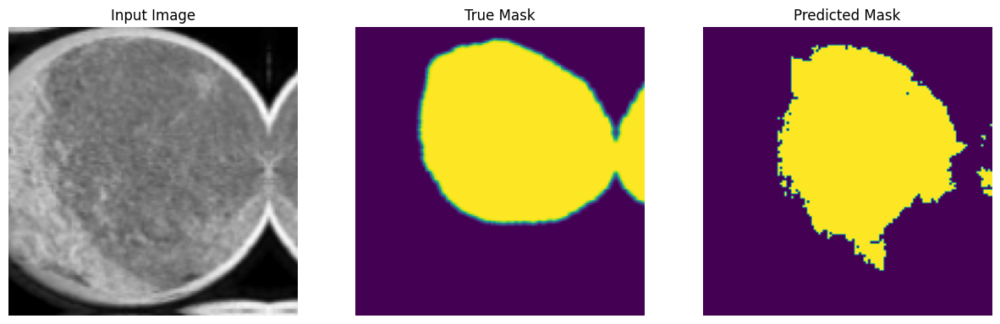


Sample Prediction after epoch 59

6/6 [==============================] - 3s 469ms/step - loss: 0.2152 - accuracy: 0.8429 - val_loss: 0.2804 - val_accuracy: 0.8861
Epoch 60/200
1/1 [==============================] - 0s 183ms/step


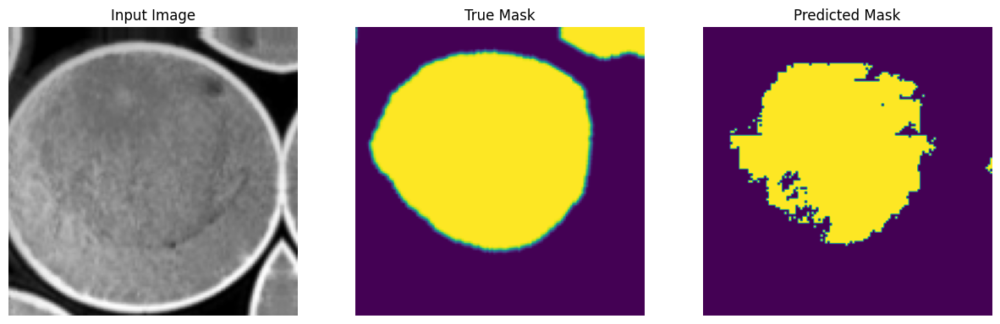


Sample Prediction after epoch 60

6/6 [==============================] - 3s 506ms/step - loss: 0.2070 - accuracy: 0.8433 - val_loss: 0.2746 - val_accuracy: 0.8848
Epoch 61/200
1/1 [==============================] - 0s 410ms/step


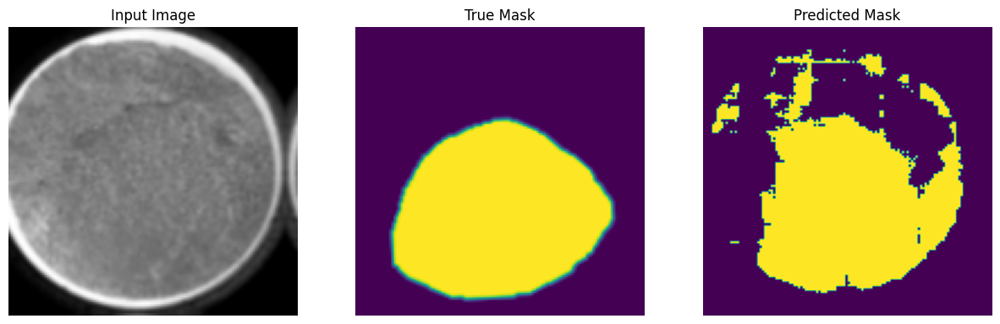


Sample Prediction after epoch 61

6/6 [==============================] - 4s 667ms/step - loss: 0.2161 - accuracy: 0.8410 - val_loss: 0.2511 - val_accuracy: 0.8923
Epoch 62/200
1/1 [==============================] - 0s 195ms/step


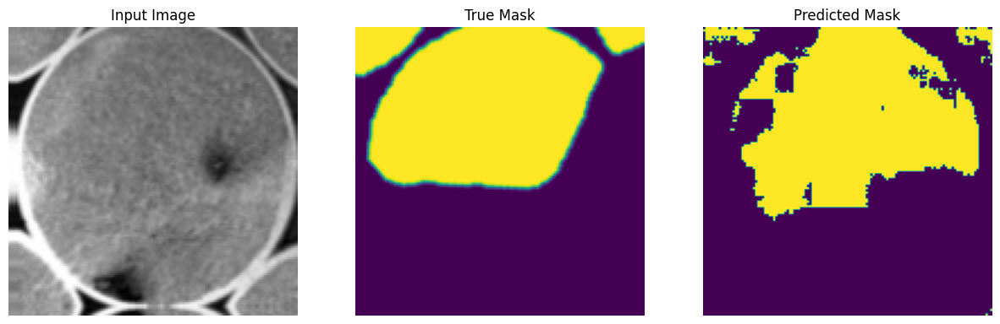


Sample Prediction after epoch 62

6/6 [==============================] - 4s 649ms/step - loss: 0.1862 - accuracy: 0.8591 - val_loss: 0.2522 - val_accuracy: 0.8936
Epoch 63/200
1/1 [==============================] - 0s 237ms/step


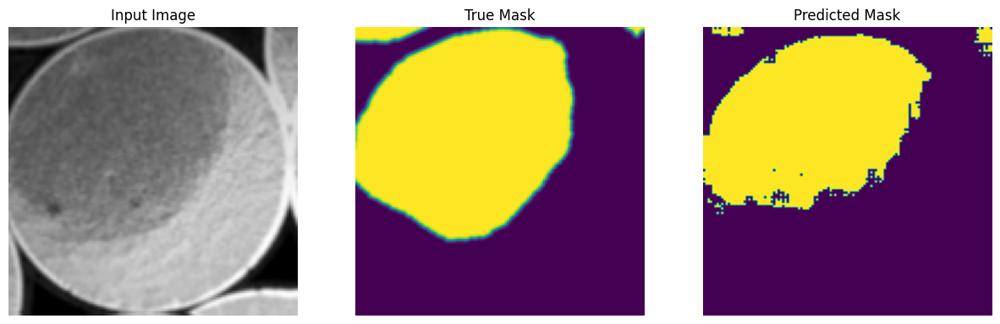


Sample Prediction after epoch 63

6/6 [==============================] - 3s 550ms/step - loss: 0.2227 - accuracy: 0.8377 - val_loss: 0.2901 - val_accuracy: 0.8699
Epoch 64/200
1/1 [==============================] - 0s 201ms/step


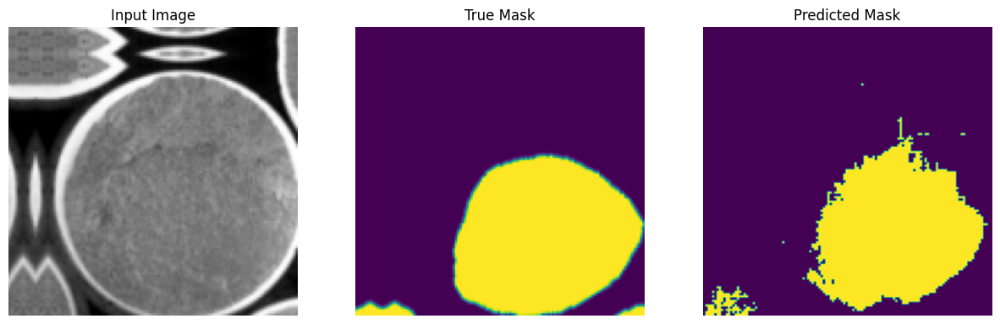


Sample Prediction after epoch 64

6/6 [==============================] - 3s 505ms/step - loss: 0.2045 - accuracy: 0.8457 - val_loss: 0.2647 - val_accuracy: 0.8902
Epoch 65/200
1/1 [==============================] - 0s 193ms/step


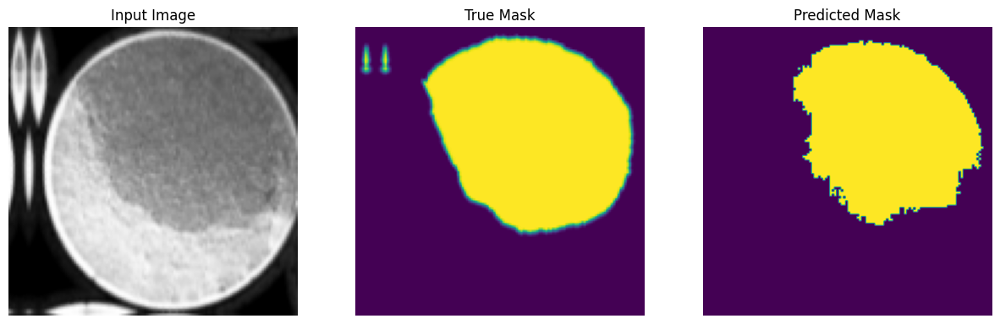


Sample Prediction after epoch 65

6/6 [==============================] - 3s 530ms/step - loss: 0.2249 - accuracy: 0.8356 - val_loss: 0.2356 - val_accuracy: 0.8993
Epoch 66/200
1/1 [==============================] - 0s 187ms/step


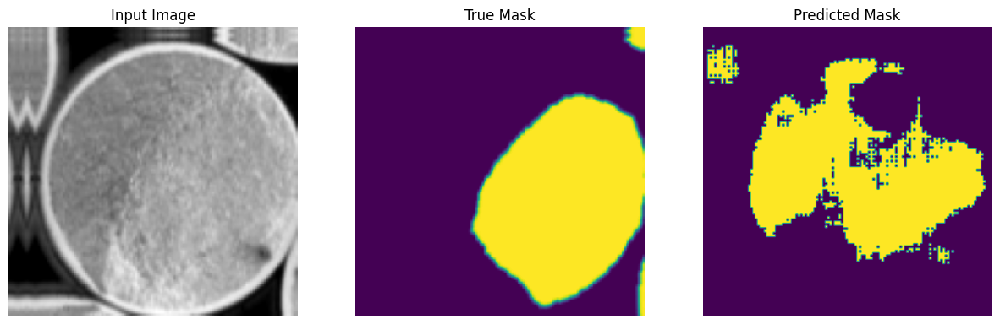


Sample Prediction after epoch 66

6/6 [==============================] - 3s 497ms/step - loss: 0.1873 - accuracy: 0.8557 - val_loss: 0.2566 - val_accuracy: 0.8907
Epoch 67/200
1/1 [==============================] - 0s 180ms/step


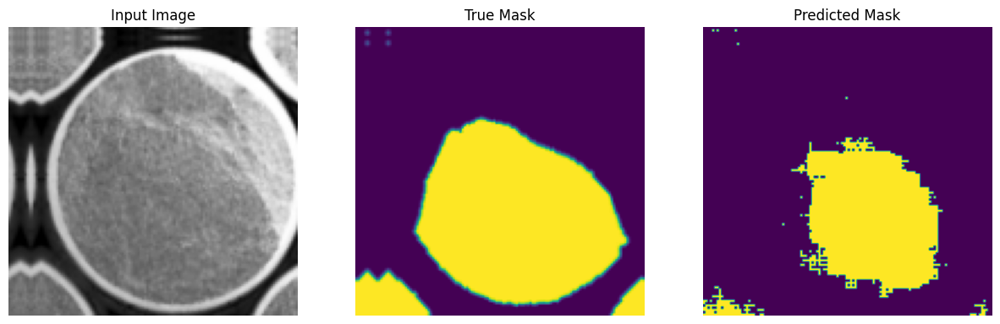


Sample Prediction after epoch 67

6/6 [==============================] - 3s 498ms/step - loss: 0.2291 - accuracy: 0.8436 - val_loss: 0.2986 - val_accuracy: 0.8862
Epoch 68/200
1/1 [==============================] - 0s 204ms/step


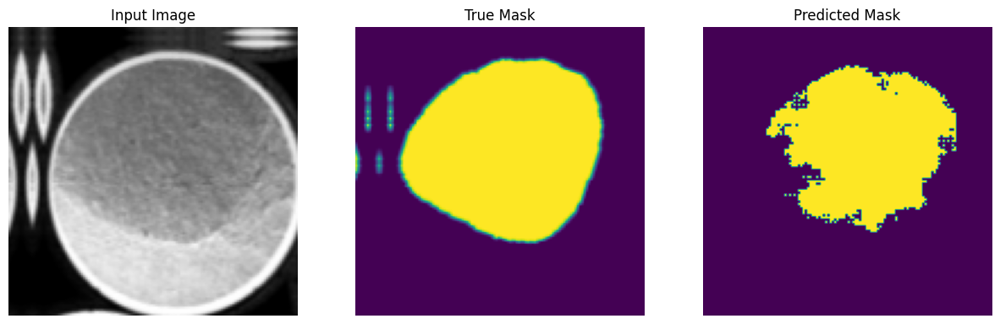


Sample Prediction after epoch 68

6/6 [==============================] - 3s 502ms/step - loss: 0.1977 - accuracy: 0.8500 - val_loss: 0.2480 - val_accuracy: 0.8990
Epoch 69/200
1/1 [==============================] - 0s 187ms/step


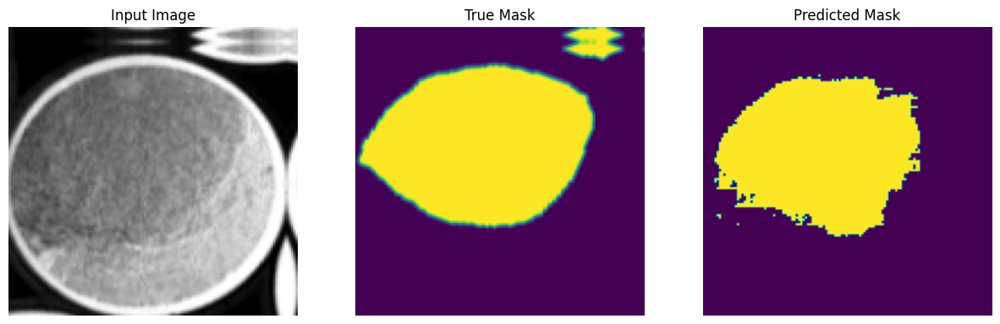


Sample Prediction after epoch 69

6/6 [==============================] - 3s 467ms/step - loss: 0.1755 - accuracy: 0.8684 - val_loss: 0.2458 - val_accuracy: 0.9030
Epoch 70/200
1/1 [==============================] - 0s 200ms/step


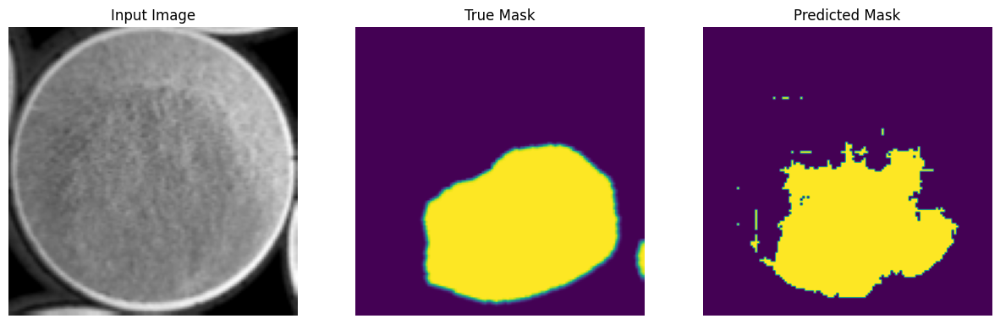


Sample Prediction after epoch 70

6/6 [==============================] - 3s 499ms/step - loss: 0.1874 - accuracy: 0.8629 - val_loss: 0.2554 - val_accuracy: 0.8973
Epoch 71/200
1/1 [==============================] - 0s 175ms/step


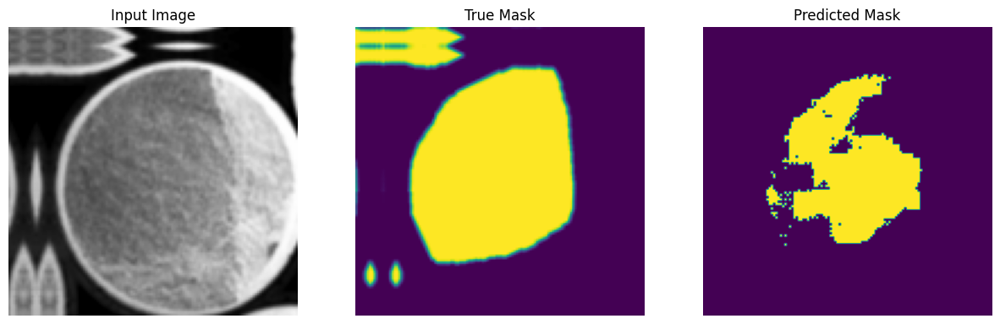


Sample Prediction after epoch 71

6/6 [==============================] - 3s 505ms/step - loss: 0.2224 - accuracy: 0.8474 - val_loss: 0.2833 - val_accuracy: 0.8834
Epoch 72/200
1/1 [==============================] - 0s 207ms/step


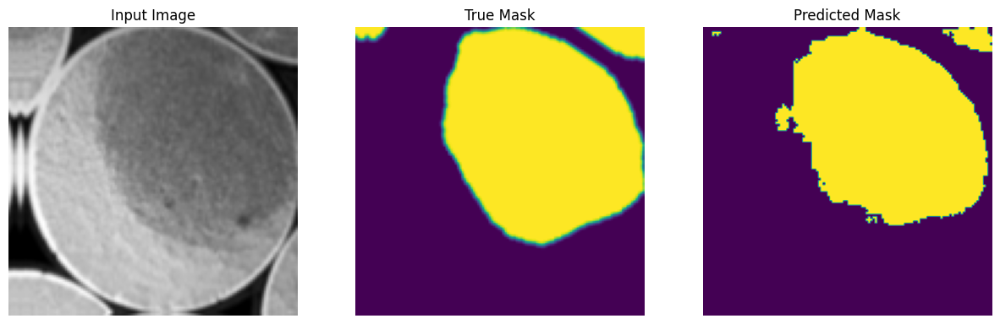


Sample Prediction after epoch 72

6/6 [==============================] - 3s 512ms/step - loss: 0.2029 - accuracy: 0.8469 - val_loss: 0.2707 - val_accuracy: 0.8895
Epoch 73/200
1/1 [==============================] - 0s 181ms/step


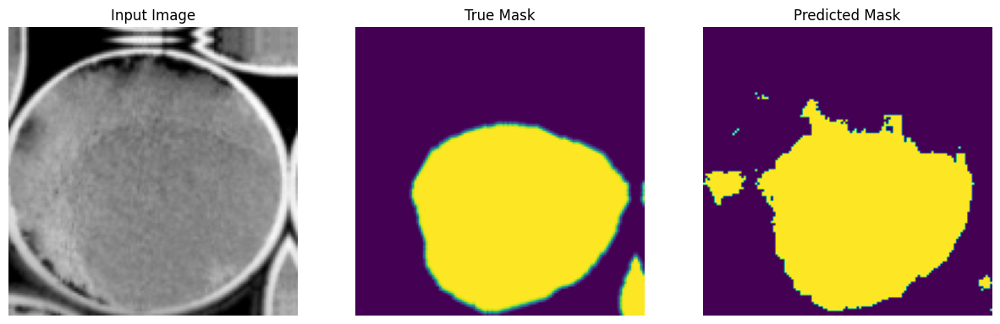


Sample Prediction after epoch 73

6/6 [==============================] - 3s 517ms/step - loss: 0.2016 - accuracy: 0.8495 - val_loss: 0.2606 - val_accuracy: 0.8905
Epoch 74/200
1/1 [==============================] - 0s 191ms/step


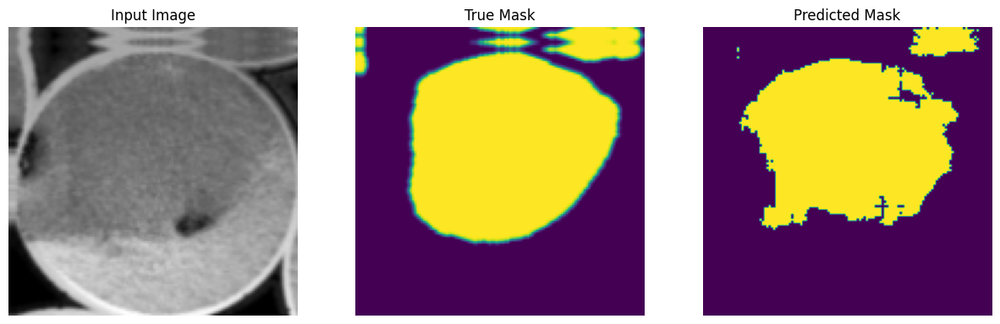


Sample Prediction after epoch 74

6/6 [==============================] - 3s 470ms/step - loss: 0.2193 - accuracy: 0.8441 - val_loss: 0.2528 - val_accuracy: 0.8965
Epoch 75/200
1/1 [==============================] - 0s 175ms/step


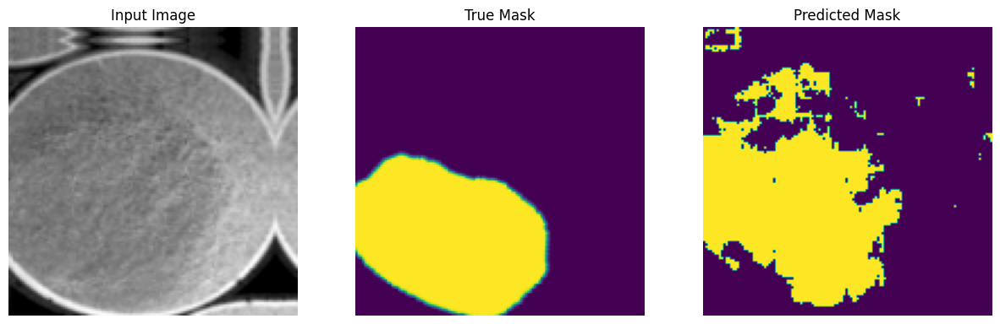


Sample Prediction after epoch 75

6/6 [==============================] - 3s 474ms/step - loss: 0.1905 - accuracy: 0.8523 - val_loss: 0.2690 - val_accuracy: 0.8928
Epoch 76/200
1/1 [==============================] - 0s 185ms/step


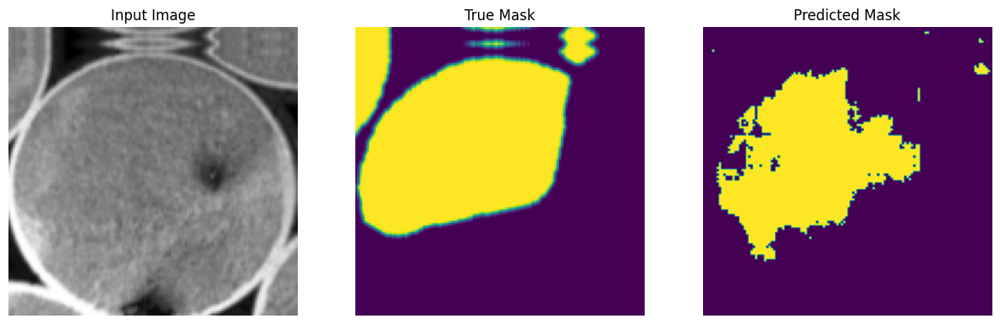


Sample Prediction after epoch 76

6/6 [==============================] - 3s 593ms/step - loss: 0.1936 - accuracy: 0.8569 - val_loss: 0.3540 - val_accuracy: 0.8593
Epoch 77/200
1/1 [==============================] - 0s 189ms/step


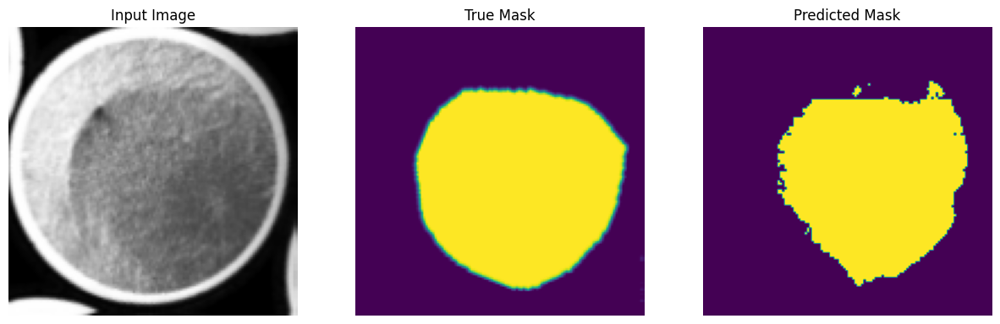


Sample Prediction after epoch 77

6/6 [==============================] - 3s 498ms/step - loss: 0.2118 - accuracy: 0.8479 - val_loss: 0.2538 - val_accuracy: 0.8914
Epoch 78/200
1/1 [==============================] - 0s 185ms/step


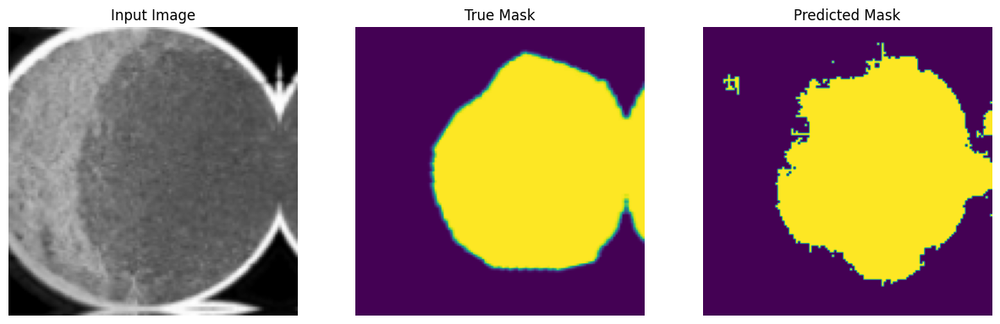


Sample Prediction after epoch 78

6/6 [==============================] - 3s 526ms/step - loss: 0.1897 - accuracy: 0.8543 - val_loss: 0.2427 - val_accuracy: 0.8956
Epoch 79/200
1/1 [==============================] - 0s 196ms/step


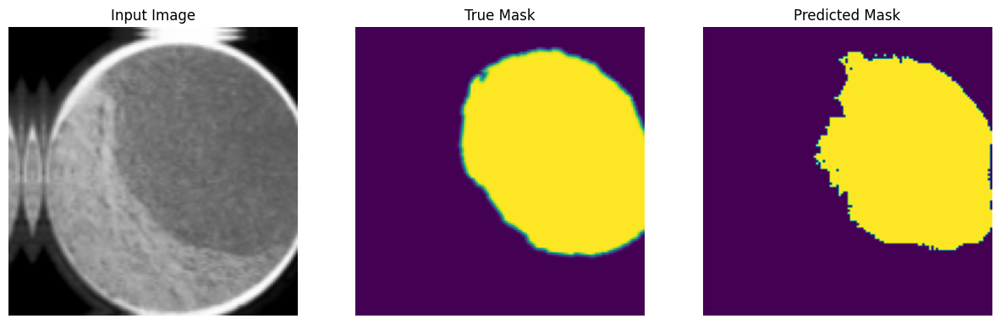


Sample Prediction after epoch 79

6/6 [==============================] - 3s 533ms/step - loss: 0.1840 - accuracy: 0.8620 - val_loss: 0.2467 - val_accuracy: 0.8969
Epoch 80/200
1/1 [==============================] - 0s 184ms/step


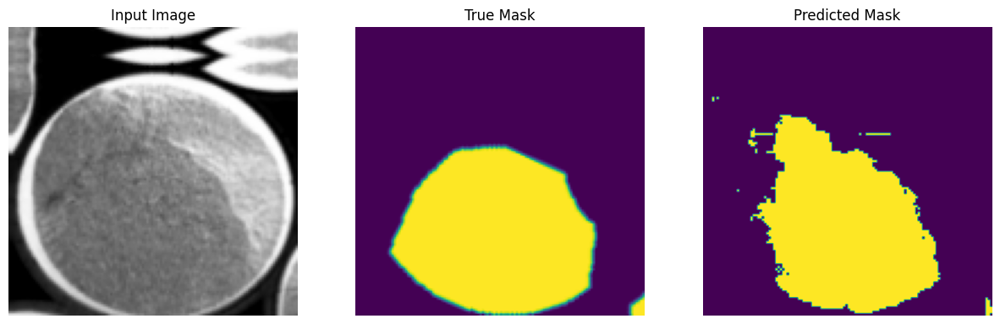


Sample Prediction after epoch 80

6/6 [==============================] - 3s 487ms/step - loss: 0.1881 - accuracy: 0.8563 - val_loss: 0.2551 - val_accuracy: 0.8909
Epoch 81/200
1/1 [==============================] - 0s 203ms/step


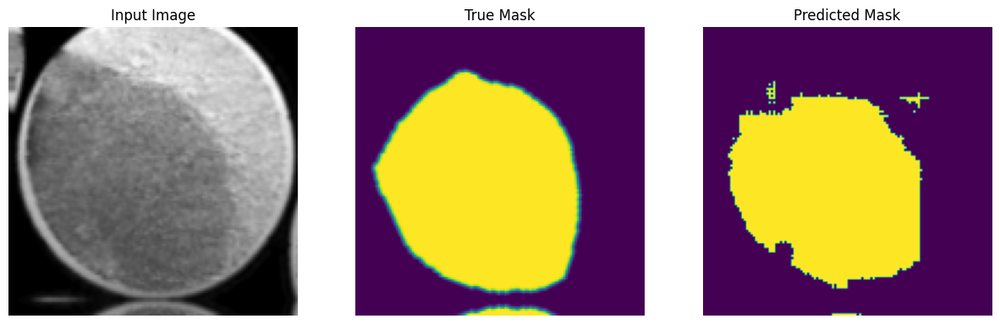


Sample Prediction after epoch 81

6/6 [==============================] - 3s 490ms/step - loss: 0.2241 - accuracy: 0.8411 - val_loss: 0.2497 - val_accuracy: 0.8972
Epoch 82/200
1/1 [==============================] - 0s 197ms/step


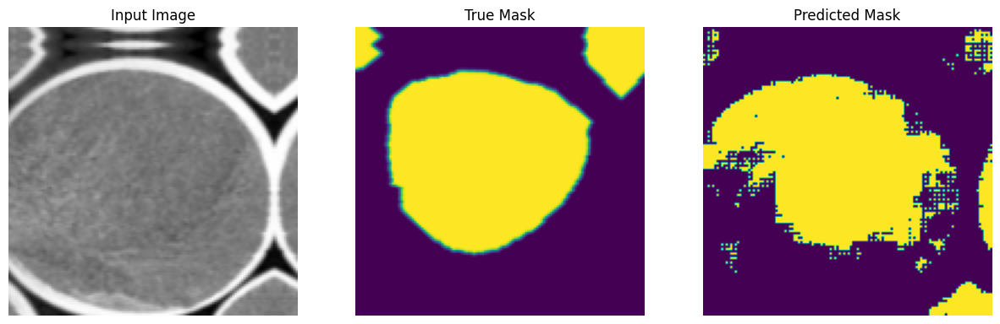


Sample Prediction after epoch 82

6/6 [==============================] - 3s 495ms/step - loss: 0.1936 - accuracy: 0.8525 - val_loss: 0.2643 - val_accuracy: 0.8876
Epoch 83/200
1/1 [==============================] - 0s 184ms/step


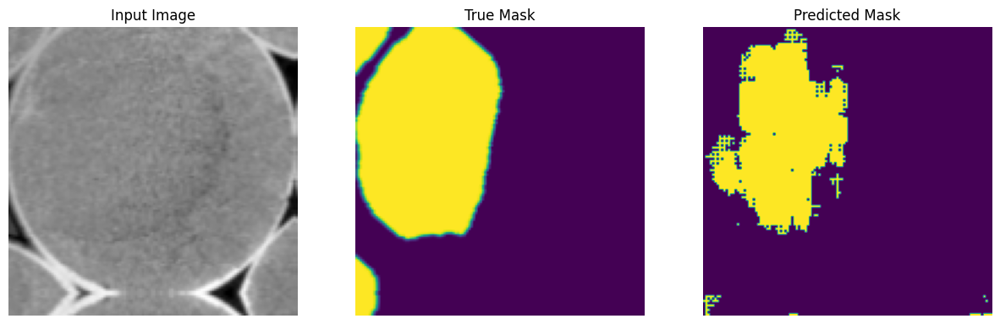


Sample Prediction after epoch 83

6/6 [==============================] - 3s 510ms/step - loss: 0.2277 - accuracy: 0.8449 - val_loss: 0.3958 - val_accuracy: 0.8536
Epoch 84/200
1/1 [==============================] - 0s 192ms/step


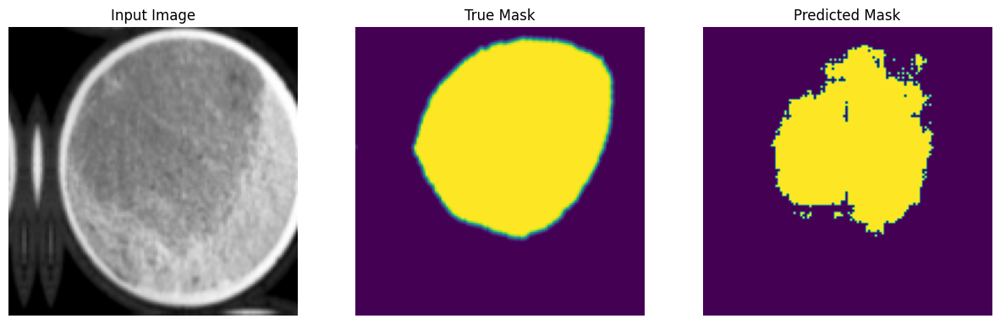


Sample Prediction after epoch 84

6/6 [==============================] - 3s 485ms/step - loss: 0.2259 - accuracy: 0.8320 - val_loss: 0.2832 - val_accuracy: 0.8856
Epoch 85/200
1/1 [==============================] - 0s 198ms/step


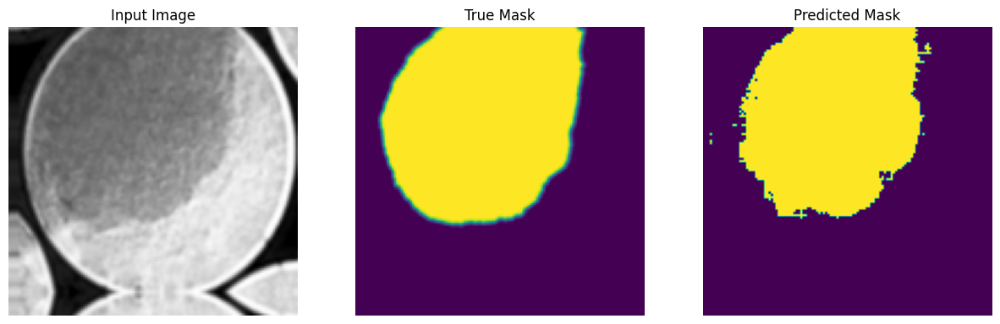


Sample Prediction after epoch 85

6/6 [==============================] - 3s 557ms/step - loss: 0.2236 - accuracy: 0.8460 - val_loss: 0.2567 - val_accuracy: 0.8937


In [118]:
from keras.callbacks import EarlyStopping
EPOCHS = 100
VAL_SUBSPLITS = 5
VALIDATION_STEPS = len(X_test)//BATCH_SIZE
STEPS_PER_EPOCH = len(X_train)//BATCH_SIZE

EPOCHS = 200
VAL_SUBSPLITS = 5
VALIDATION_STEPS = len(X_test) // BATCH_SIZE
STEPS_PER_EPOCH = len(X_train) // BATCH_SIZE

early_stopping = EarlyStopping(
    monitor='val_loss',  # The metric to monitor (e.g., validation loss)
    patience=20,         # Number of epochs to wait without improvement
    restore_best_weights=True  # Restore the model to the best weights
)

model_history = model.fit(train_batches, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_batches,
                          callbacks=[DisplayCallback(), early_stopping])

In [126]:
# evaluate the model
model.evaluate(test_batches, verbose=1)

# Compute intersection over union
iou = tf.keras.metrics.MeanIoU(num_classes=OUTPUT_CLASSES)
for images, labels in test_batches:
    pred = model.predict(images)
    pred = tf.argmax(pred, axis=-1)
    pred = pred[..., tf.newaxis]
    iou.update_state(labels, pred)

print("Accuracy = ", model.evaluate(test_batches, verbose=1)[1] * 100, "%")
print("Mean IoU =", iou.result().numpy())

2/2 [==============================] - 0s 127ms/step - loss: 0.2590 - accuracy: 0.8920
Accuracy =  89.20053243637085 %
Mean IoU = 0.7822404


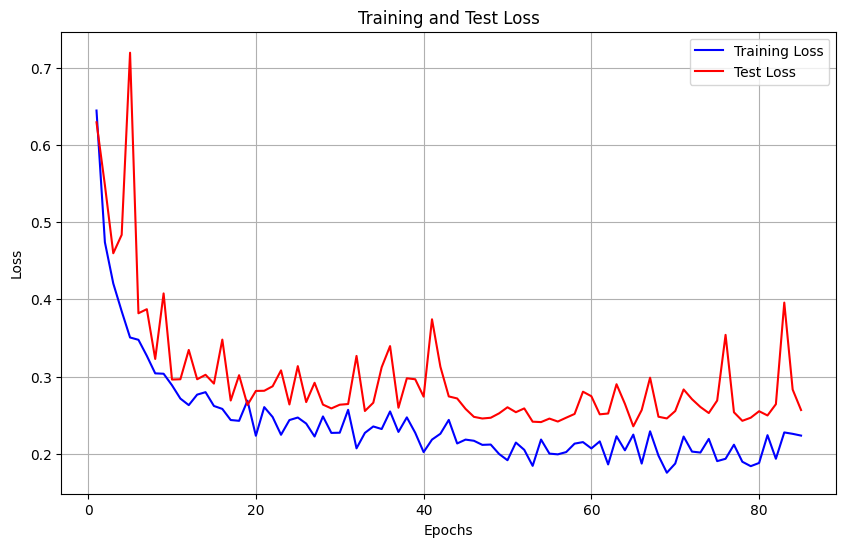

In [120]:
import matplotlib.pyplot as plt

# Extract data from the model history
train_loss = model_history.history['loss']
test_loss = model_history.history['val_loss']

# Create an array of the epoch numbers for the x-axis
epochs = range(1, len(train_loss) + 1)

# Plot the training loss
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, test_loss, 'r', label='Test Loss')
plt.title('Training and Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

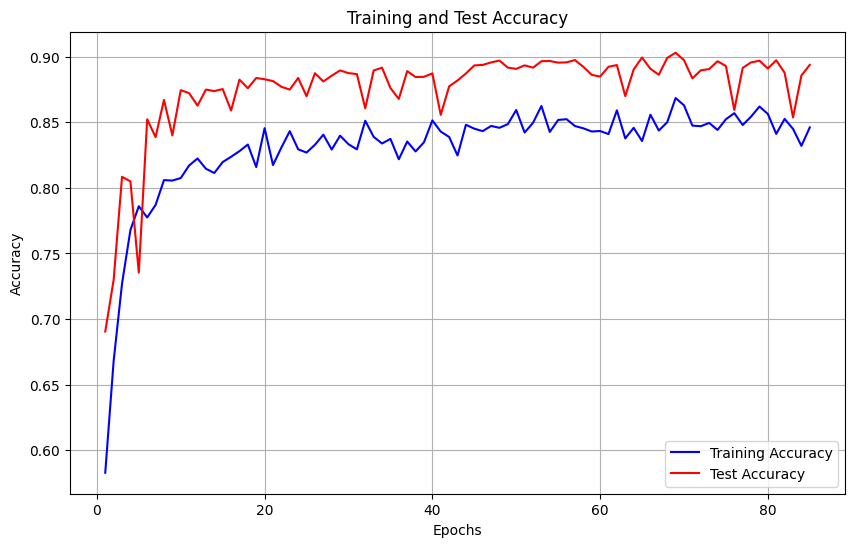

In [121]:
# Plot the training and testing accuracy
train_acc = model_history.history['accuracy']
test_acc = model_history.history['val_accuracy']

plt.figure(figsize=(10, 6))
plt.plot(epochs, train_acc, 'b', label='Training Accuracy')
plt.plot(epochs, test_acc, 'r', label='Test Accuracy')
plt.title('Training and Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.show()

In [122]:
# Save the model
tf.keras.models.save_model(model, 'internal_mask_unet_model')

INFO:tensorflow:Assets written to: internal_mask_unet_model\assets


INFO:tensorflow:Assets written to: internal_mask_unet_model\assets
